# CDK Binding Affinity

In [3958]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from rdkit import Chem, DataStructs
import src.scripts.cheekyfunctions as cf
from importlib import reload

reload(cf)

<module 'src.scripts.cheekyfunctions' from '/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py'>

### Columns

- `BindingDB Ligand Name`: (Text) name of ligand. 

- `Target Name`: (Text) Name of the target (indicate deletions (e.g., a truncated sequence) or mutations (e.g., Met results changed for the sake of stability)). For example, [262-930, L692P] means the protein includes residues 262-930 of the full sequence and Leu 692 is replaced by Pro. 

- `Target Source Organism According to Curator or DataSource`: (Text) Organism associated with the protein target. 



##### Measure of Binding Affinity:

- `Ki (nM)`: (Real>0) Inhibition Constant; concentration of the inhibitor required to reduce the activity of an enzyme by half in the absence of the substrate. The lower the Ki value, the stronger the inhibitor binds to its target.

- `IC50 (nM)`: (Real >0) (Values are occasionally reported as “>X”, where X is Real, following the source document) The concentration of the inhibitor that reduces the enzyme activity by 50%. Same as Ki but corrected for experimental condition, making it more accurate and independent of substrate concentration.

- `Kd (nM)`: (Real >0) (Values are occasionally reported as “>X”, where X is Real, following the source document.) Dissociation Constant; It represents the concentration of the ligand at which half of the available binding sites on the target are occupied. Lower Kd, higher binding affinity.

- `EC50 (nM)`: (Real >0) (Values are occasionally reported as “>X”, where X is Real, following the source document.) Concentration of a drug or ligand required to produce 50% of its maximum effect.

- `kon (M-1-s-1)`: (Real >0) Assocition rate constant; Measure of the rate at which a ligand binds to its target, how quickly the ligand and the target come together to form a complex.

- `Koff(s-1)`

- `pH`

- `Temp ( C)`



##### Chain of the Binding: 

- `Number of Protein Chains in Target (>1 implies a multichain complex)`: (1,2 or 3) The following information will be provided, if available, for each chain in the protein. (indicated by .n for the n+1 chain)

- `BindingDB Target Chain Sequence`:(text) sequences of AAs. 

- `UniProt (SwissProt) Entry Name of Target Chain`: (text) name of the target chain.

Or: 

- `UniProt (TrEMBL) Entry Name of Target Chain`: (text) name of the target chain. 




In [3959]:
df = pd.read_csv('data/BindingDB_col_cleaned.tsv', sep='\t') # loading of the cleaned data (CDKs selected and columns necessary for analysis selected)
df.head()

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,Ki (nM),IC50 (nM),Kd (nM),EC50 (nM),kon (M-1-s-1),koff (s-1),...,Number of Protein Chains in Target (>1 implies a multichain complex),BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,UniProt (TrEMBL) Entry Name of Target Chain,BindingDB Target Chain Sequence.1,UniProt (SwissProt) Entry Name of Target Chain.1,UniProt (TrEMBL) Entry Name of Target Chain.1,BindingDB Target Chain Sequence.2,UniProt (SwissProt) Entry Name of Target Chain.2,UniProt (TrEMBL) Entry Name of Target Chain.2
0,COc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)cc1,3-((4-Methoxyphenyl)-amino)-4-((3-chlorophenyl...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,NaN,5800,NaN,NaN,NaN,NaN,...,2,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,NaN,MALRVTRNSKINAENKAKINMAGAKRVPTAPAATSKPGLRPRTALG...,CCNB1_HUMAN,NaN,NaN,NaN,NaN
1,Oc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)cc1,3-((4-Hydroxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,NaN,>1000,NaN,NaN,NaN,NaN,...,2,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,NaN,MALRVTRNSKINAENKAKINMAGAKRVPTAPAATSKPGLRPRTALG...,CCNB1_HUMAN,NaN,NaN,NaN,NaN
2,COc1cccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)c1,3-((3-Methoxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,NaN,4300,NaN,NaN,NaN,NaN,...,2,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,NaN,MALRVTRNSKINAENKAKINMAGAKRVPTAPAATSKPGLRPRTALG...,CCNB1_HUMAN,NaN,NaN,NaN,NaN
3,Oc1cccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)c1,3-((3-Hydroxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,NaN,3000,NaN,NaN,NaN,NaN,...,2,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,NaN,MALRVTRNSKINAENKAKINMAGAKRVPTAPAATSKPGLRPRTALG...,CCNB1_HUMAN,NaN,NaN,NaN,NaN
4,CC(C)(C)OC(=O)Nc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl...,3-((4-(N-BOC-amino)phenyl)amino)-4-((3-chlorop...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,NaN,57000,NaN,NaN,NaN,NaN,...,2,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,NaN,MALRVTRNSKINAENKAKINMAGAKRVPTAPAATSKPGLRPRTALG...,CCNB1_HUMAN,NaN,NaN,NaN,NaN


### Formating values of Binding Affinity constant 

The values for Ki, Kd, IC50... can take forms like >100 or 2e+5 that need to be transformed to be analysed

In [3960]:
# Fonction 'clean' to remove the characters > and <, remove the spaces and convert the strings into integers
def clean(ki, patern=['<', '>']):
    ki = str(ki).replace(patern[0], '')
    ki = str(ki).replace(patern[1], '')
    ki = ki.strip()       
    try:
        ki = int(ki)
    except ValueError:  
        ki = None
    return (ki)

### Binding Affinity constant ditribution 
- Ki (nM):

In [3961]:
Ki_cleaned = df['Ki (nM)'].apply(lambda ki: clean(ki)) # cleaning of the Ki values
Ki_cleaned = Ki_cleaned.dropna(axis=0) # deleting all the NaN values

In [3962]:
Ki_cleaned.describe()

count     1560.000000
mean      2778.834615
std       5640.131485
min          1.000000
25%         69.750000
50%        300.000000
75%       1357.500000
max      20000.000000
Name: Ki (nM), dtype: float64

Discuss: 50% of the values are <300. A Ki<300 represents a strong or moderate affinity. There is outliers (Ki equal to 20000) that represents no binding affinity. 

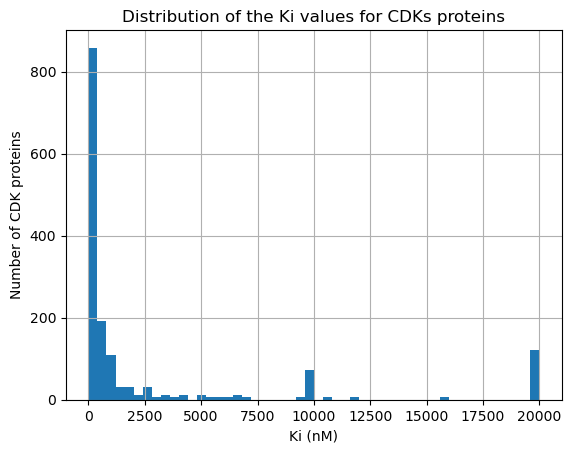

In [3963]:
plt.title('Distribution of the Ki values for CDKs proteins')
plt.xlabel('Ki (nM)')
plt.ylabel('Number of CDK proteins')
Ki_cleaned.hist(bins=50)
plt.show()

- IC50 (nM):

In [3964]:
# 45'822 rows have IC50 value, 6822 of them contain < and 13476 contain >
# we should do samples to put the values into ranges => not done yet because maybe not useful... instead the same technique as above is performed

IC50_cleaned = df['IC50 (nM)'].apply(lambda ic: clean(ic))
IC50_cleaned[IC50_cleaned > 20000] = np.nan # some very high values make the distribution not readable and relevant so we decided to remove them
IC50_cleaned = IC50_cleaned.dropna(axis=0)


In [3965]:
IC50_cleaned.describe()

count    37512.000000
mean      2846.408989
std       5218.814603
min          1.000000
25%         36.000000
50%        264.500000
75%       2500.000000
max      20000.000000
Name: IC50 (nM), dtype: float64

discuss: same idea, almost the same value of the 50th percentile.

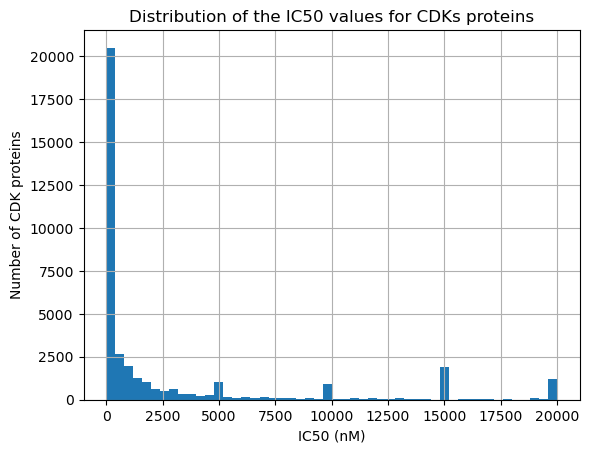

In [3966]:
plt.title('Distribution of the IC50 values for CDKs proteins')
plt.xlabel('IC50 (nM)')
plt.ylabel('Number of CDK proteins')
IC50_cleaned.hist(bins=50)
plt.show()

- Kd (nM):

In [3967]:
# 3552 rows have Kd value and 2058 Kd are equal to >100000 
Kd_cleaned = df['Kd (nM)'].apply(lambda kd: clean(kd))
Kd_cleaned = Kd_cleaned.dropna(axis=0)

In [3968]:
Kd_cleaned.describe()

count      3066.000000
mean      68256.953033
std       45653.357450
min           8.000000
25%        2300.000000
50%      100000.000000
75%      100000.000000
max      100000.000000
Name: Kd (nM), dtype: float64

Discuss: More than 50% of the values is equal to 100000 (very weak binding affinity).

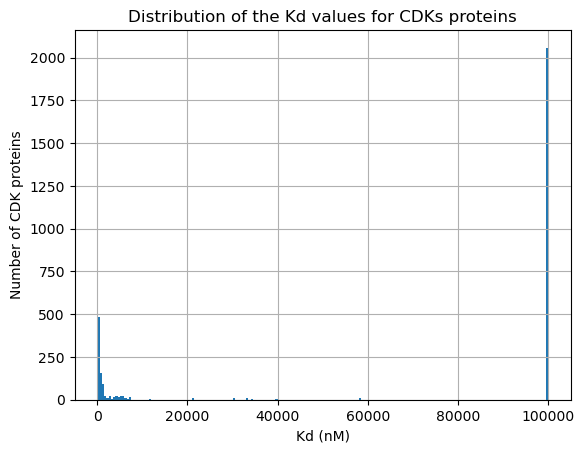

In [3969]:
plt.title('Distribution of the Kd values for CDKs proteins')
plt.xlabel('Kd (nM)')
plt.ylabel('Number of CDK proteins')
Kd_cleaned.hist(bins=200)
plt.show()

- EC50 (nM):

In [3970]:
EC50_cleaned = df['EC50 (nM)'].dropna()
print(EC50_cleaned)

4548     70.0
13297    70.0
22046    70.0
30795    70.0
39544    70.0
48293    70.0
Name: EC50 (nM), dtype: float64


Discuss: There is only 6 values of EC50, all equals to 70. It is probabybly not exploitable.

- Number of target chains:

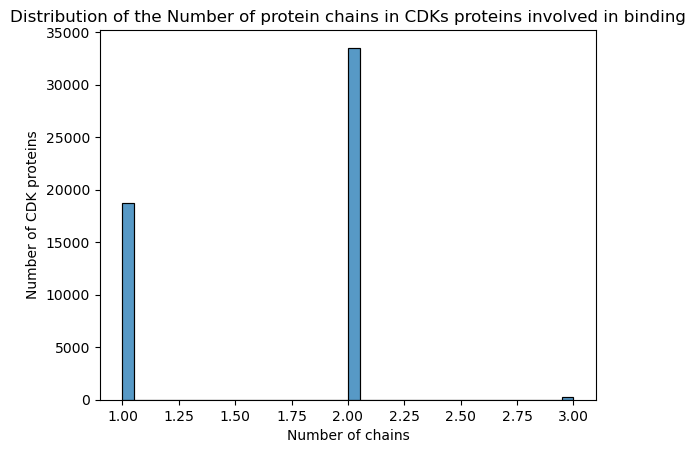

In [3971]:
Number_of_chain_cleaned=df['Number of Protein Chains in Target (>1 implies a multichain complex)'].dropna()
plt.title('Distribution of the Number of protein chains in CDKs proteins involved in binding')
plt.xlabel('Number of chains')
plt.ylabel('Number of CDK proteins')
sns.histplot(Number_of_chain_cleaned)
plt.show()


### Now only working with IC50 values

In [3972]:
IC50_cleaned.shape

(37512,)

How to achieve this (in steps):
Preprocess:
only looking at relevant (47) CDK and their binding ligands (suppose it will be enough data? we can add more data for milestone 3)

Find all unique binding ligands (4500?)

Create four dataframes for each of the measures of binding affinities for CDKs and ligands (will each be of dimension 47x4500?).

Assign labels to the affinity scores for three levels of affinity (Ki_weak, Ki_moderate, Ki_strong, EC50_weak, EC_moderate , ... etc. 12 labels in total) Julie and Mathilde might find a good source to indicate this. We will have to define a good (and fair!) mapping and justify it!
Construct dataframe: match unique pairs ligands-CDKs -> make dataframe with the affinity measures and labels as rows

Maybe dimensionality reduction: PCA (but we dont have so many parameters so might not make sense)

Clustering/grouping: group on similar ligands (from a bioperspective view - how to? database?)

Look into the Regression model if time permits.


In [3973]:
df.shape

(52494, 22)

In [3974]:
#df consists only of CDK's and their binding ligands
#Preprocessing to only consider CDK's and their binding ligands
#Number of unique CDK's
df["Target Name"].unique().size

47

In [3975]:
df["BindingDB Ligand Name"].unique().size

4577

In [3976]:
# Checking how many different ligands are there for each CDK
df.groupby("Target Name")["BindingDB Ligand Name"].nunique().sort_values(ascending=False)

Target Name
Cyclin-dependent kinase 2/G1/S-specific cyclin-E1                                1156
Cyclin-A2/Cyclin-dependent kinase 2                                               870
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1                                 821
Cyclin-dependent kinase 4                                                         706
Cyclin-dependent kinase/G2/mitotic-specific cyclin- 1                             509
Cyclin-dependent kinase 1                                                         468
Cyclin-dependent kinase 2                                                         456
Cyclin-dependent kinase 9                                                         455
Cyclin-dependent kinase 1/G2/mitotic-specific cyclin-B                            451
Cyclin-T1/Cyclin-dependent kinase 9                                               337
Cyclin-dependent kinase 6                                                         269
Cyclin-dependent kinase 5 activator 1 [99-

In [3977]:
# Cleaning columns of binding affinity scores 

affinity_columns = ['Ki (nM)', 'IC50 (nM)', 'Kd (nM)', 'EC50 (nM)']
for col in affinity_columns:
    df[col] = df[col].apply(lambda value: clean(value))

df.sample(5)

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,Ki (nM),IC50 (nM),Kd (nM),EC50 (nM),kon (M-1-s-1),koff (s-1),...,Number of Protein Chains in Target (>1 implies a multichain complex),BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,UniProt (TrEMBL) Entry Name of Target Chain,BindingDB Target Chain Sequence.1,UniProt (SwissProt) Entry Name of Target Chain.1,UniProt (TrEMBL) Entry Name of Target Chain.1,BindingDB Target Chain Sequence.2,UniProt (SwissProt) Entry Name of Target Chain.2,UniProt (TrEMBL) Entry Name of Target Chain.2
21000,O=C(Nc1n[nH]c2cc(ccc12)-c1ccc[nH]1)C1CC1,CHEMBL260929::N-[6-(1H-pyrrol-2-yl)-1H-indazol...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,NaN,497.0,NaN,None,NaN,NaN,...,2,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,NaN,MLGNSAPGPATREAGSALLALQQTALQEDQENINPEKAAPVQQPRT...,CCNA2_HUMAN,NaN,NaN,NaN,NaN
22552,Fc1ccccc1-c1cc(NCc2cccnc2)n2ncc(Cl)c2n1,"US8575203, I-4::US8580782, 5",Cyclin-dependent kinase 2,Homo sapiens,NaN,21.0,NaN,None,NaN,NaN,...,1,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22143,CN(C)CCN(C)S(=O)(=O)c1ccc2NC(=O)\C(=C3/Nc4cccc...,"Indirubin derivative, 25",Cyclin-dependent kinase 2,Homo sapiens,NaN,NaN,NaN,None,NaN,NaN,...,1,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15927,CN1Cc2c([nH]c3nccc(-c4cc(F)ccc14)c23)C1=C[C@H]...,"US9328112, 80",Cyclin-T1/Cyclin-dependent kinase 9,Homo sapiens,NaN,97.0,NaN,None,NaN,NaN,...,2,MEGERKNNNKRWYFTREQLENSPSRRFGVDPDKELSYRQQAANLLQ...,CCNT1_HUMAN,NaN,MAKQYDSVECPFCDEVSKYEKLAKIGQGTFGEVFKARHRKTGQKVA...,CDK9_HUMAN,NaN,NaN,NaN,NaN
3816,CCCCNC(=O)N1Cc2n[nH]c(NC(=O)[C@@H](C)c3ccc4ccc...,"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazo...",Cyclin-dependent kinase 5 activator 1,Homo sapiens,NaN,150.0,NaN,None,NaN,NaN,...,2,MGTVLSLSPSYRKATLFEDGAATVGHYTAVQNSKNAKDKNLKRHSI...,CD5R1_HUMAN,NaN,MQKYEKLEKIGEGTYGTVFKAKNRETHEIVALKRVRLDDDDEGVPS...,CDK5_HUMAN,NaN,NaN,NaN,NaN


In [3978]:
# Constructing 4 dataframes for each type of affinity score

Ki_df = df[
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "Ki (nM)",
        "BindingDB Target Chain Sequence",
    ]
]
Kd_df = df[
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "Kd (nM)",
        "BindingDB Target Chain Sequence",
    ]
]
IC50_df = df[
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "IC50 (nM)",
        "BindingDB Target Chain Sequence",
        "UniProt (SwissProt) Entry Name of Target Chain"
    ]
]
EC50_df = df[
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "EC50 (nM)",
        "BindingDB Target Chain Sequence",
    ]
]

In [ ]:
IC50_df = df[
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "IC50 (nM)",
        "BindingDB Target Chain Sequence",
        "UniProt (SwissProt) Entry Name of Target Chain",
    ]
]

IC50_df.groupby(
    [
        "Ligand SMILES",
        "BindingDB Ligand Name",
        "Target Name",
        "Target Source Organism According to Curator or DataSource",
        "BindingDB Target Chain Sequence",
        "UniProt (SwissProt) Entry Name of Target Chain",
    ]
)["IC50 (nM)"].median().reset_index()

IC50_df["IC50_class"] = IC50_df["IC50 (nM)"].apply(
    lambda value: cf.classify_IC50(value)
)

IC50_ligand_strong = IC50_df[IC50_df["IC50_class"] == "strong"]
IC50_ligand_strong.groupby("BindingDB Ligand Name")

strong_ligands_cdks_2 = cf.create_df_on_intersection_of_values(
    IC50_ligand_strong,
    "Target Name",
    "Cyclin-A2/Cyclin-dependent kinase 2",
    "Cyclin-dependent kinase 2/G1/S-specific cyclin-E1",
    "BindingDB Ligand Name",
)

In [3979]:
# For each newly constructed df we will drop rows with NaN values in the affinity score column
Ki_df = Ki_df.dropna(subset=["Ki (nM)"])
Kd_df = Kd_df.dropna(subset=["Kd (nM)"])
IC50_df = IC50_df.dropna(subset=["IC50 (nM)"])
EC50_df = EC50_df.dropna(subset=["EC50 (nM)"])

# Checking the number of rows in each df
print(Ki_df.shape)
print(Kd_df.shape)
print(IC50_df.shape)
print(EC50_df.shape)

(1560, 6)
(3066, 6)
(40704, 7)
(0, 6)


In [3980]:
IC50_df.head()

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,IC50 (nM),BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain
0,COc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)cc1,3-((4-Methoxyphenyl)-amino)-4-((3-chlorophenyl...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,5800.0,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
1,Oc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)cc1,3-((4-Hydroxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,1000.0,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
2,COc1cccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)c1,3-((3-Methoxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,4300.0,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
3,Oc1cccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl)c4)c23)c1,3-((3-Hydroxyphenyl)amino)-4-((3-chlorophenyl)...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,3000.0,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
4,CC(C)(C)OC(=O)Nc1ccc(Nc2[nH]nc3ncnc(Nc4cccc(Cl...,3-((4-(N-BOC-amino)phenyl)amino)-4-((3-chlorop...,Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,57000.0,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN


In [3981]:
print(IC50_df["IC50 (nM)"].describe())

count      40704.000000
mean       12340.050118
std        59544.045676
min            1.000000
25%           43.000000
50%          400.000000
75%         5000.000000
max      1000000.000000
Name: IC50 (nM), dtype: float64


In [3982]:
# If there are duplicates of CDK-ligand pair we take the median of the affinity score & the target source organism is the same

IC50_df = IC50_df.groupby(["Ligand SMILES","BindingDB Ligand Name", "Target Name", "Target Source Organism According to Curator or DataSource", "BindingDB Target Chain Sequence", "UniProt (SwissProt) Entry Name of Target Chain"])["IC50 (nM)"].median().reset_index()

In [3983]:

    
IC50_df['IC50_class'] = IC50_df['IC50 (nM)'].apply(lambda value: cf.classify_IC50(value))

IC50_df.head()
    

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,IC50 (nM),IC50_class
0,Brc1cc2c(NC(=O)C3CC3)n[nH]c2nc1-c1ccccc1,"6-aryl-pyrazolo[3,4-b]pyridine analogue 17::CH...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,1000.0,weak
1,Brc1cc2c(NC(=O)C3CC3)n[nH]c2nc1-c1ccco1,CHEMBL408564::N-[5-bromo-6-(furan-2-yl)-1H-pyr...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,1000.0,weak
2,Brc1cc2c(NC(=O)C3CC3)n[nH]c2nc1-c1cccs1,CHEMBL260231::N-[5-bromo-6-(thiophen-2-yl)-1H-...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,639.0,moderate
3,Brc1cc2c(NC(=O)C3CC3)n[nH]c2nc1-c1nccs1,"CHEMBL261690::N-[5-bromo-6-(1,3-thiazol-2-yl)-...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,1000.0,weak
4,Brc1cc2c(NC(=O)C3CCCC3)n[nH]c2nc1-c1cccs1,CHEMBL407980::N-[5-bromo-6-(thiophen-2-yl)-1H-...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,1000.0,weak


In [3984]:
print(IC50_df.shape)
IC50_df['IC50_class'].value_counts()

(5872, 8)


IC50_class
weak        2412
strong      2095
moderate    1365
Name: count, dtype: int64

### Generating initial heatmap to see correlations between ligands and CDKs

In [3985]:
IC50_pivot = pd.pivot_table(
    data=IC50_df,
    values=["IC50_class"],
    index=["Target Name"],
    columns=["BindingDB Ligand Name"],
    aggfunc="first"
)

mapping = {
    'strong' : 1,
    'moderate' : 2,
    'weak' : 3,
}

IC50_pivot = IC50_pivot.replace(mapping).fillna(0)



/var/folders/sm/bpqf8wpj6478c8rtz31k076r0000gn/T/ipykernel_22311/695890154.py:15: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  IC50_pivot = IC50_pivot.replace(mapping).fillna(0)


In [3986]:
IC50_pivot.sample(5)

IC50_class  \
BindingDB Ligand Name                              ((2-chloro-5-methyl-phenyl)-{6-[4-(3-(dimethylamino)-2-hydroxy-propoxy)-phenylamino]-pyrimidin-4-yl}-amino)-acetonitrile::2-[(2-chloro-5-methylphenyl)[6-({4-[(2R)-3-(dimethylamino)-2-hydroxypropoxy]phenyl}amino)pyrimidin-4-yl]amino]acetonitrile::AZ2   
Target Name                                                                                                                                                                                                                                                                                                    
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1                                                 1.0                                                                                                                                                                                                          
Cyclin-dependent kinase 5 activator 1                                                             0.0                                                                                                                                                                                                          
Cyclin-A1/Cyclin-dependent kinase 2                                                               0.0                                                                                                                                                                                                          
Cyclin-A2 [171-432]/Cyclin-dependent kinase 2 [...                                                0.0                                                                                                                                                                                                          
Cyclin-A2 [171-432]/Cyclin-dependent kinase 2 [...                                                3.0                                                                                                                                                                                                          

                                                                                                                                                                                                                                                                                                                                                       \
BindingDB Ligand Name                              (+)-(S)-(Z)-1-[3-(3-Methoxy-1H-pyrrol-2-ylmethylene)-5-nitro-2-oxo-2,3-dihydro-1H-indol-4-yl]-pyrrolidine-3-carboxylic acid amide::(3S)-1-[(3Z)-3-[(3-methoxy-1H-pyrrol-2-yl)methylidene]-5-nitro-2-oxo-2,3-dihydro-1H-indol-4-yl]pyrrolidine-3-carboxamide::C-4 substituted oxindole inhibitor 7d   
Target Name                                                                                                                                                                                                                                                                                                                                             
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1                                                 0.0                                                                                                                                                                                                                                                   
Cyclin-dependent kinase 5 activator 1                                                             0.0                                                                                                                                                                                                                                                   
Cyclin-A1/Cyclin-dependent kinase 2                                                               0.0                               

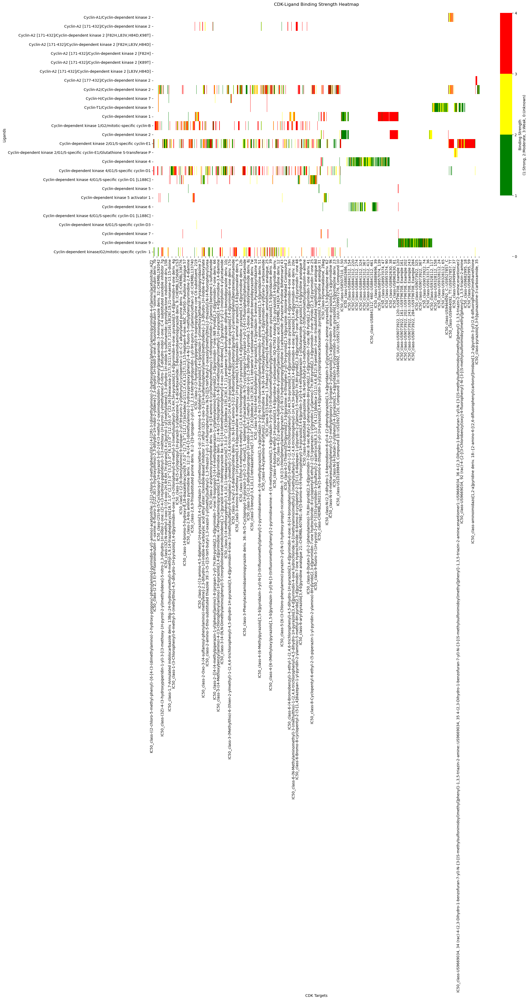

In [3987]:
# Create heatmap
import matplotlib.colors as mcolors
plt.figure(figsize=(20, 12))


discrete_colormap = mcolors.ListedColormap(["white", "green", "yellow", "red"])

bounds = [0,1,2,3,4]
norm = mcolors.BoundaryNorm(bounds, discrete_colormap.N)

ax = sns.heatmap(
    IC50_pivot,
    cmap=discrete_colormap,
    norm=norm,
    annot=False,  # Too many values to annotate
    cbar_kws={
        "label": "Binding Strength\n(1:Strong, 2:Moderate, 3:Weak, 0:Unknown)",
        "orientation": "vertical",
        "ticks": [0, 1, 2, 3, 4],  # Ensure the color bar has discrete labels
    },
)

plt.title("CDK-Ligand Binding Strength Heatmap", pad=20)
plt.xlabel("CDK Targets")
plt.ylabel("Ligands")

# Rotate x-axis labels for readability
plt.xticks(rotation=90, ha="right")
plt.yticks(rotation=0)


plt.show()

For this milestone we have visually inspected the heatmap to indentify which groups of ligands we wish to compare. 
**For the next milestone this part of the process will be automated by considering all combinations of strong interactions.**

Now the question arises, if a group of ligands binds strongly to the same group of CDKs is it because the ligands have similar structural features?

From the categorical heatmap of ligands interacting with the CDKs we have identified 2 interesting cases to compare to reason about this question:

Case 1: Strong ligand interactions with Cyclin-A2/Cyclin-dependent kinase 2 & Cyclin-dependent kinase 2/G1/S-specific cyclin-E1
* Since they are both different variant of CDK2 their amino acide sequence is very similar. 

Case 2: Strong ligand interactions with Cyclin-dependent kinase 2/G1/S-specific cyclin-E1 & Cyclin-dependent kinase 4/G1/S-specific cyclin-D1
* This case was mainly deemed interesting due to the amount of data available across the 2 CDKs. The same ligands have been tested on both CDKs and shows strong affinities.

To investigate these cases we will make use of the infamous industry standard for Cheminformatics, namely the Tanimoto similarity coefficient. 
This model compares 2 different SMILES strings and returns a value between 0 and 1. 1 being identical and 0 being completely different. To know more about Tanimoto see: 
https://www.rdkit.org/docs/GettingStartedInPython.html . Values > 0.85 are in this case considered similar. Ref: https://en.wikipedia.org/wiki/Chemical_similarity 


In [3988]:
### Figuring if there are ligands that are strong across multiple CDK's 
### For each ligand counting the amount of times it is strong across CDK's

IC50_ligand_strong = IC50_df[IC50_df["IC50_class"] == "strong"]
IC50_ligand_strong.groupby("BindingDB Ligand Name")

### Creating continous heatmap for the IC50 binding affinity values for CDKs and ligands

* 1: Instead of classifying the binding affinity values we will normalize them and create a heatmap of the values.
    * 1.1: Normalize the values of IC50 for each CDK and ligand pair.
    * 1.2: **First** plot a distribution of the values before normalization and check if one needs to remove outliers.

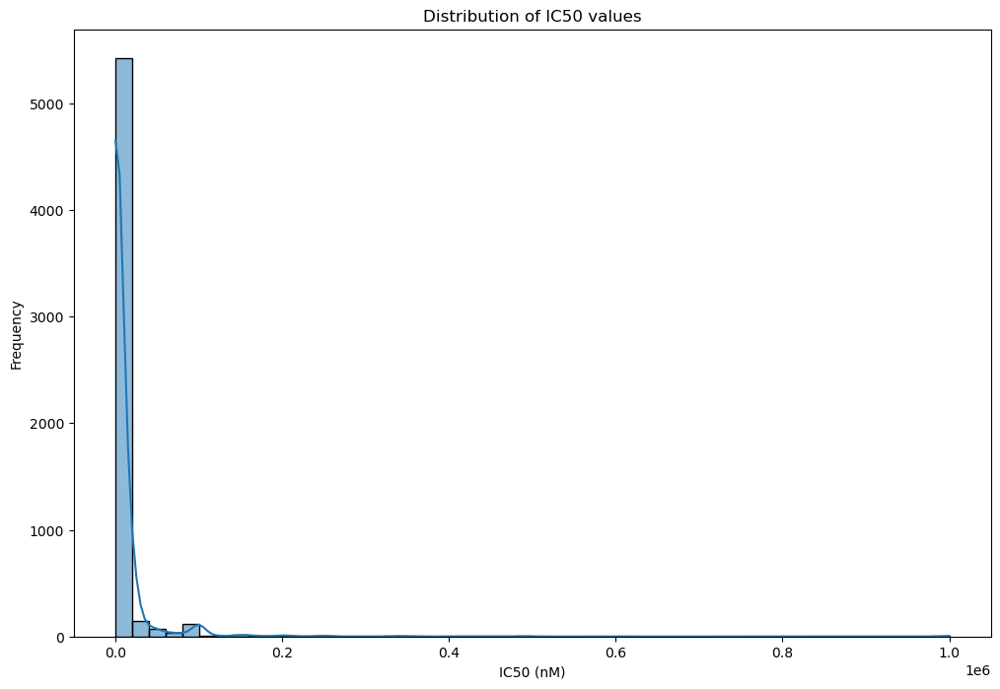

In [3989]:
# Plotting the distribution of IC50 values
plt.figure(figsize=(12, 8))
sns.histplot(IC50_df["IC50 (nM)"], bins=50, kde=True)
plt.title("Distribution of IC50 values")
plt.xlabel("IC50 (nM)")
plt.ylabel("Frequency")
plt.show()


In [3990]:
IC50_df.describe()

,IC50 (nM)
count,5872.000000
mean,10560.756812
std,45627.607031
min,1.000000
25%,44.000000
50%,382.000000
75%,5000.000000
max,1000000.000000


(5872, 8)


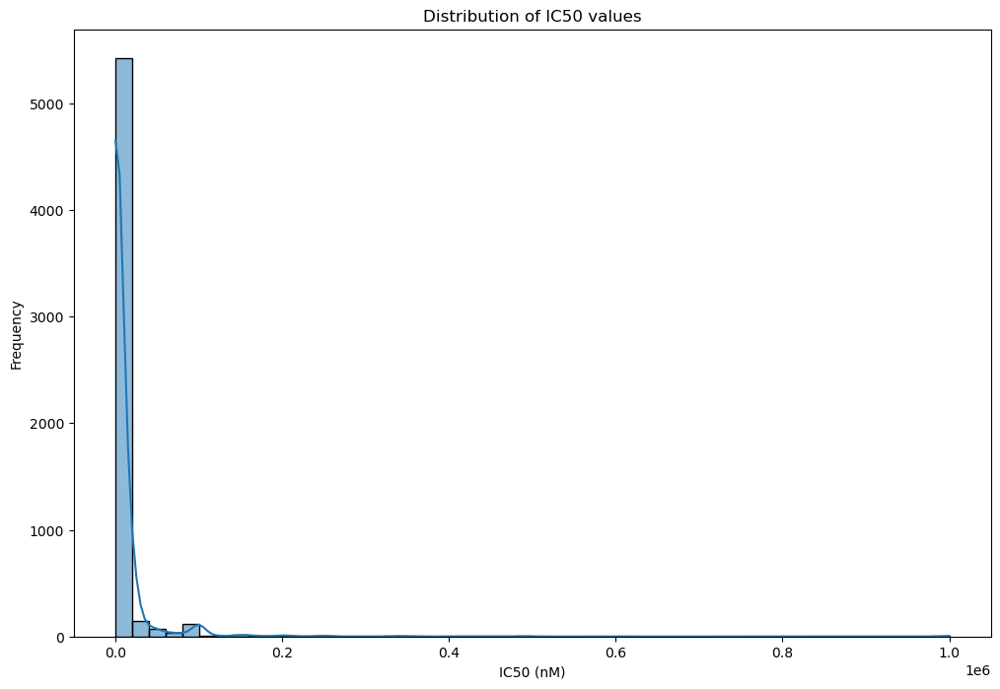

In [3991]:
# Removing outliers at 20000 nM 

# Ensuring not too much data is lost
print(IC50_df.shape)

# Plotting the distribution of IC50 values
plt.figure(figsize=(12, 8))
sns.histplot(IC50_df["IC50 (nM)"], bins=50, kde=True)
plt.title("Distribution of IC50 values")
plt.xlabel("IC50 (nM)")
plt.ylabel("Frequency")
plt.show()


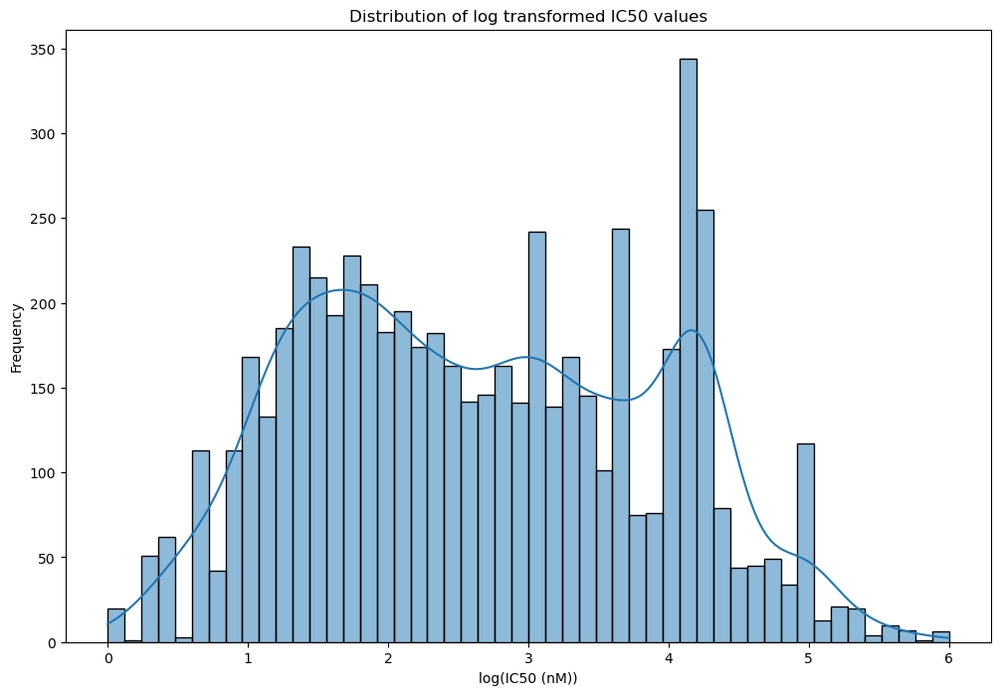

In [3992]:
# Still pretty heavy tailed distribution, let's try to log transform the data
IC50_df["IC50_log"] = np.log10(IC50_df["IC50 (nM)"])

# Plotting the distribution of log transformed IC50 values
plt.figure(figsize=(12, 8))
sns.histplot(IC50_df["IC50_log"], bins=50, kde=True)
plt.title("Distribution of log transformed IC50 values")
plt.xlabel("log(IC50 (nM))")
plt.ylabel("Frequency")
plt.show()


In [3993]:
IC50_df["IC50_log"].describe()

count    5872.000000
mean        2.663131
std         1.236208
min         0.000000
25%         1.643453
50%         2.582057
75%         3.698970
max         6.000000
Name: IC50_log, dtype: float64

As we can see the distribution is quite heavy tailed but behaves well when its log transformed. We will normalize the log transformed values.

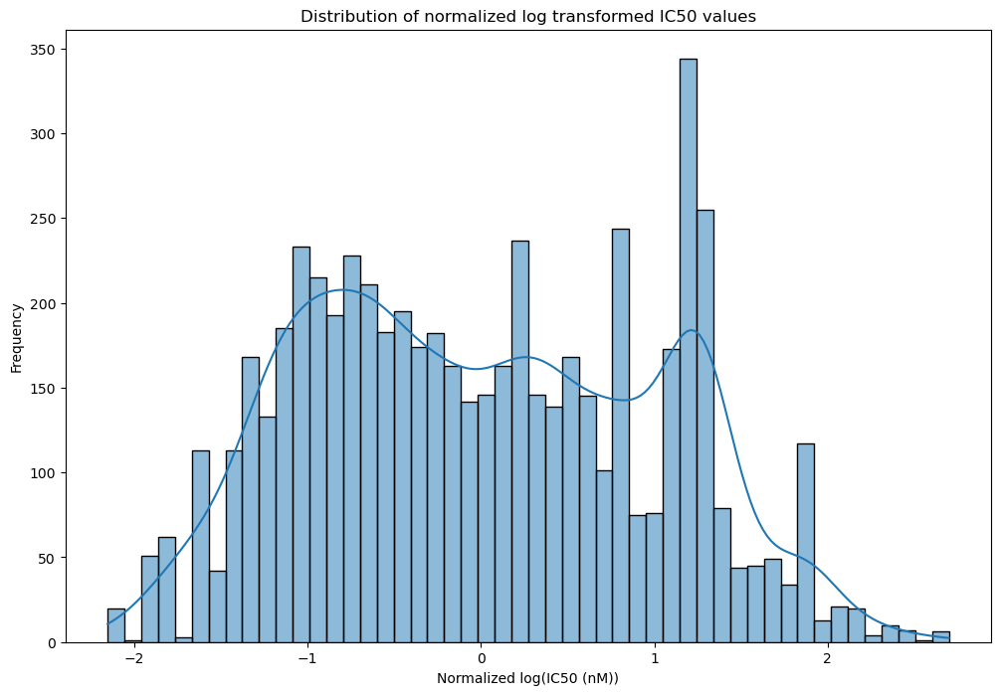

In [3994]:
# Normalizing the log transformed IC50 values
IC50_df["IC50_log_norm"] = (IC50_df["IC50_log"] - IC50_df["IC50_log"].mean()) / IC50_df["IC50_log"].std()

# Plotting the distribution of normalized log transformed IC50 values
plt.figure(figsize=(12, 8))
sns.histplot(IC50_df["IC50_log_norm"], bins=50, kde=True)
plt.title("Distribution of normalized log transformed IC50 values")
plt.xlabel("Normalized log(IC50 (nM))")
plt.ylabel("Frequency")
plt.show()


In [3995]:
# Creating the pivot table for the normalized log transformed IC50 values
IC50_pivot_log_norm = pd.pivot_table(
    data=IC50_df,
    values=["IC50_log_norm"],
    index=["Target Name"],
    columns=["BindingDB Ligand Name"],
    aggfunc="mean"
)



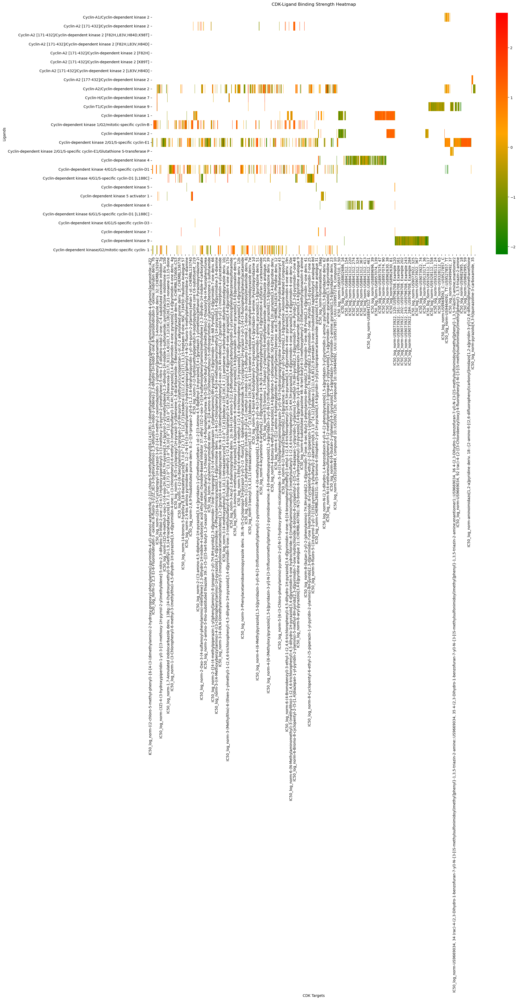

In [3996]:
# Create heatmap
import matplotlib.colors as mcolors

# Continous colormap ranging from green to red
cmap=mcolors.LinearSegmentedColormap.from_list("", ["green", "orange", "red"])

plt.figure(figsize=(20, 12))

ax = sns.heatmap(
    IC50_pivot_log_norm,
    cmap=cmap,
)


plt.title("CDK-Ligand Binding Strength Heatmap", pad=20)
plt.xlabel("CDK Targets")
plt.ylabel("Ligands")

# Rotate x-axis labels for readability
plt.xticks(rotation=90, ha="right")
plt.yticks(rotation=0)


plt.show()

___

In [3997]:
IC50_ligand_strong.groupby("BindingDB Ligand Name")["IC50_class"].count().sort_values(ascending=False)

BindingDB Ligand Name
8-Cyclohexyl-2-[4-(4-methylpiperazin-1-yl)phenylamino]-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclohexyl-2-{[4-(4-methylpiperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 70                                        4
3-[(9bR)-5-oxo-1H,2H,3H,5H,9bH-benzo[a]pyrrolizin-9-yl]-1-pyridin-2-ylurea::CHEMBL141247::N -(pyrrolidino[2,1-b]isoindolin-4-on-8-yl)-N-(pyridin-2yl)urea::Pyridin-2-yl urea::diarylurea deriv. 1                                                                     4
2-aminothiazole 6::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-phenyl-1,3-thiazol-2-amine                                                                                                                                                                    3
Pyrazolopyrimidone analog, RGB-286147                                                                                                                                                     

In [3998]:
thiazol_2_amine_ligand_df = IC50_df[
    IC50_df["BindingDB Ligand Name"]
    == "2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-(pyridin-2-yl)-1,3-thiazol-2-amine"
]
thiazol_2_amine_ligand_df

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,IC50 (nM),IC50_class,IC50_log,IC50_log_norm
437,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccn3)s2)o1,"2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,2.0,strong,0.301030,-1.910763
438,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccn3)s2)o1,"2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,9.0,strong,0.954243,-1.382363
439,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccn3)s2)o1,"2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase/G2/mitotic-specific cy...,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,4.0,strong,0.602060,-1.667252


In [3999]:
US8507510_df = IC50_df[IC50_df["BindingDB Ligand Name"] == "US8507510, 1.18"]

In [4000]:
US8507510_df.head()

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,IC50 (nM),IC50_class,IC50_log,IC50_log_norm
3932,C[C@@H](O)[C@@H](C)Nc1nc(Nc2ccc(cc2)S(=N)(=O)C...,"US8507510, 1.18",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,3.0,strong,0.477121,-1.768318
3933,C[C@@H](O)[C@@H](C)Nc1nc(Nc2ccc(cc2)S(=N)(=O)C...,"US8507510, 1.18",Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,3.0,strong,0.477121,-1.768318


In [4001]:
IC50_CDK_strong = IC50_df[IC50_df["IC50_class"] == "strong"]
IC50_CDK_strong_grouped = IC50_CDK_strong.groupby("Target Name")["IC50_class"].count().sort_values(ascending=False)
IC50_CDK_strong_copy = IC50_CDK_strong.copy()

In [4002]:
for row in thiazol_2_amine_ligand_df.iterrows():
    print(row[1]["Target Name"])
    print("BindingDB Target Chain Sequence")
    print(row[1]["BindingDB Target Chain Sequence"])

Cyclin-dependent kinase 2/G1/S-specific cyclin-E1
BindingDB Target Chain Sequence
MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPSTAIREISLLKELNHPNIVKLLDVIHTENKLYLVFEFLHQDLKKFMDASALTGIPLPLIKSYLFQLLQGLAFCHSHRVLHRDLKPQNLLINTEGAIKLADFGLARAFGVPVRTYTHEVVTLWYRAPEILLGCKYYSTAVDIWSLGCIFAEMVTRRALFPGDSEIDQLFRIFRTLGTPDEVVWPGVTSMPDYKPSFPKWARQDFSKVVPPLDEDGRSLLSQMLHYDPNKRISAKAALAHPFFQDVTKPVPHLRL
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1
BindingDB Target Chain Sequence
MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGGGGLPISTVREVALLRRLEAFEHPNVVRLMDVCATSRTDREIKVTLVFEHVDQDLRTYLDKAPPPGLPAETIKDLMRQFLRGLDFLHANCIVHRDLKPENILVTSGGTVKLADFGLARIYSYQMALTPVVVTLWYRAPEVLLQSTYATPVDMWSVGCIFAEMFRRKPLFCGNSEADQLGKIFDLIGLPPEDDWPRDVSLPRGAFPPRGPRPVQSVVPEMEESGAQLLLEMLTFNPHKRISAFRALQHSYLHKDEGNPE
Cyclin-dependent kinase/G2/mitotic-specific cyclin- 1
BindingDB Target Chain Sequence
MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPSTAIREISLLKELRHPNIVSLQDVLMQDSRLYLIFEFLSMDLKKYLDSIPPGQYMDSSLVKSYLYQILQGIVFCHSRRVLHRDLKPQNLLIDDKGTIKLADF

In [4003]:
uniprot_of_cdks_df = df[["Target Name", "BindingDB Target Chain Sequence", "UniProt (SwissProt) Entry Name of Target Chain"]].drop_duplicates()

In [4004]:
uniprot_of_cdks_df[
    uniprot_of_cdks_df["Target Name"].isin(
        [
            "Cyclin-dependent kinase 2/G1/S-specific cyclin-E1",
            "Cyclin-dependent kinase 4/G1/S-specific cyclin-D1",
            "Cyclin-dependent kinase/G2/mitotic-specific cyclin- 1",
            "Cyclin-dependent kinase 1",
            "Cyclin-dependent kinase 2",
        ]
    )
]

,Target Name,BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain
0,Cyclin-dependent kinase/G2/mitotic-specific cy...,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
21,Cyclin-dependent kinase 2,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN
22,Cyclin-dependent kinase 1,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN
336,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN
345,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN
1988,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,mehqllccevetirraypdtnllndrvlramlkteetcapsvsyfk...,CCND1_MOUSE


In [4005]:
print(uniprot_of_cdks_df["UniProt (SwissProt) Entry Name of Target Chain"].unique())

['CDK1_HUMAN' 'CDK2_HUMAN' 'CDK1_ORYLA' 'CDK4_HUMAN' 'CCND1_HUMAN'
 'CCND1_MOUSE' 'CD5R1_HUMAN' 'CCNH_HUMAN' 'CCNT1_HUMAN' 'CCNA2_HUMAN'
 'CD11B_HUMAN' 'CD11A_HUMAN' 'CDK19_HUMAN' 'CDK7_HUMAN' 'CDK8_HUMAN'
 'CDK9_HUMAN' 'CDK3_HUMAN' 'CDK5_HUMAN' 'CDK16_HUMAN' 'CDK17_HUMAN'
 'CDK18_HUMAN' 'CDK14_HUMAN' 'CDK6_HUMAN' 'CCNE1_HUMAN' nan 'CDKL2_HUMAN']


In [4006]:
## Looking into similarities between the 2 ligands that are strong on CDK 2 & 1

print(US8507510_df["BindingDB Ligand Name"].unique())
print(thiazol_2_amine_ligand_df["BindingDB Ligand Name"].unique())



['US8507510, 1.18']
['2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-(pyridin-2-yl)-1,3-thiazol-2-amine']


In [4007]:
IC50_CDK_strong_grouped

Target Name
Cyclin-dependent kinase 4                                    329
Cyclin-dependent kinase 2/G1/S-specific cyclin-E1            323
Cyclin-dependent kinase 9                                    317
Cyclin-A2/Cyclin-dependent kinase 2                          200
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1            197
Cyclin-T1/Cyclin-dependent kinase 9                          195
Cyclin-dependent kinase 6                                    139
Cyclin-dependent kinase/G2/mitotic-specific cyclin- 1         88
Cyclin-dependent kinase 2                                     84
Cyclin-dependent kinase 4/G1/S-specific cyclin-D1 [L188C]     83
Cyclin-dependent kinase 1                                     76
Cyclin-dependent kinase 1/G2/mitotic-specific cyclin-B        24
Cyclin-dependent kinase 5 activator 1                         15
Cyclin-A2 [171-432]/Cyclin-dependent kinase 2                  7
Cyclin-H/Cyclin-dependent kinase 7                             6
Cyclin-depend

In [4008]:
test = IC50_CDK_strong_copy[IC50_CDK_strong_copy["Target Name"] == "Cyclin-dependent kinase 4"]
test.shape


(329, 10)

___

# Comparing similarities across ligands for CDK 1 & 2

In [4009]:
strong_ligands_cdk_1_2 = cf.create_df_on_intersection_of_values(IC50_ligand_strong, "Target Name", 
                                       "Cyclin-dependent kinase 1",
                                       "Cyclin-dependent kinase 2",
                                       "BindingDB Ligand Name")

In [4010]:
print(strong_ligands_cdk_1_2.shape)
strong_ligands_cdk_1_2.head()

(60, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,CC(C)(O)CSc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,"US8507510, 3.9",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,55.0,strong,CC(C)(O)CSc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,8.0,strong
1,CC(CO)Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,"US8507510, 3.10",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,18.0,strong,CC(CO)Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,4.0,strong
2,CC(O)C(C)Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,"US8507510, 3.5",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,17.0,strong,CC(O)C(C)Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,8.0,strong
3,CC(O)CSc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,"US8507510, 3.4",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,72.0,strong,CC(O)CSc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br,Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,41.0,strong
4,CC(Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br)C(C)(C)O,"US8507510, 3.7",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,19.0,strong,CC(Sc1nc(Nc2ccc(cc2)S(C)(=N)=O)ncc1Br)C(C)(C)O,Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,11.0,strong


In [4011]:
similarity_matrix = cf.ligand_similarity_matrix(strong_ligands_cdk_1_2)

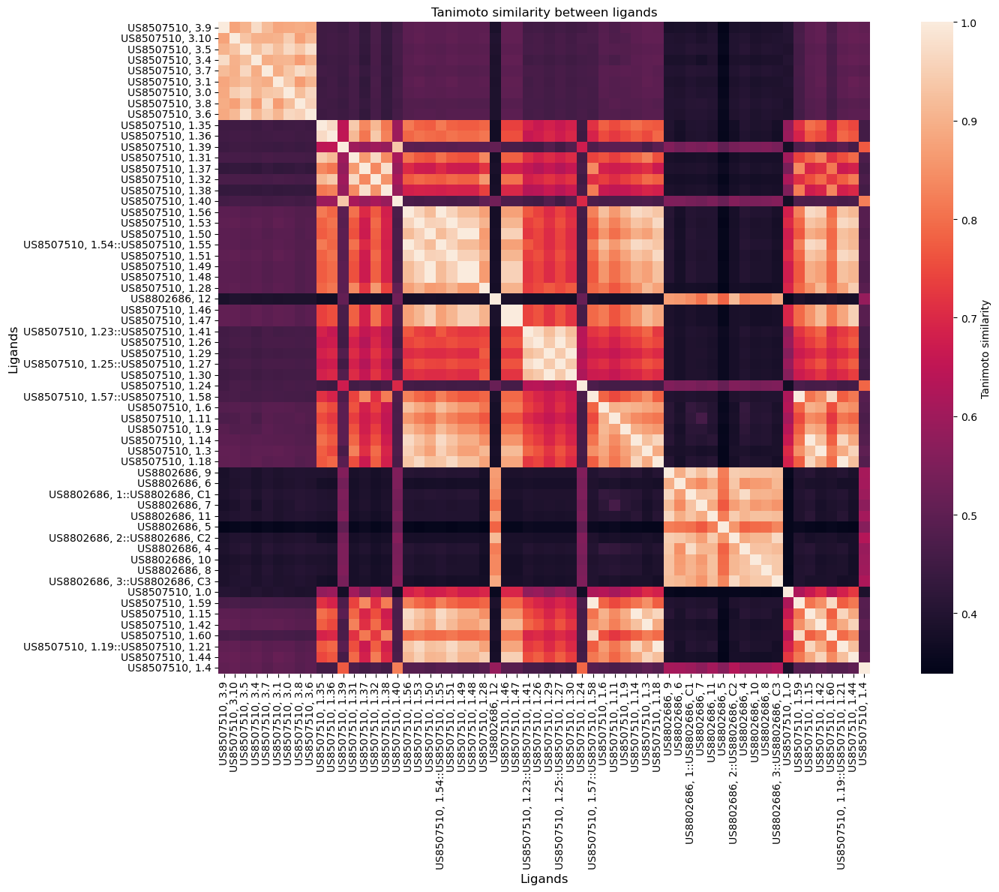

In [4012]:
cf.plot_tanimoto_similarity(similarity_matrix)

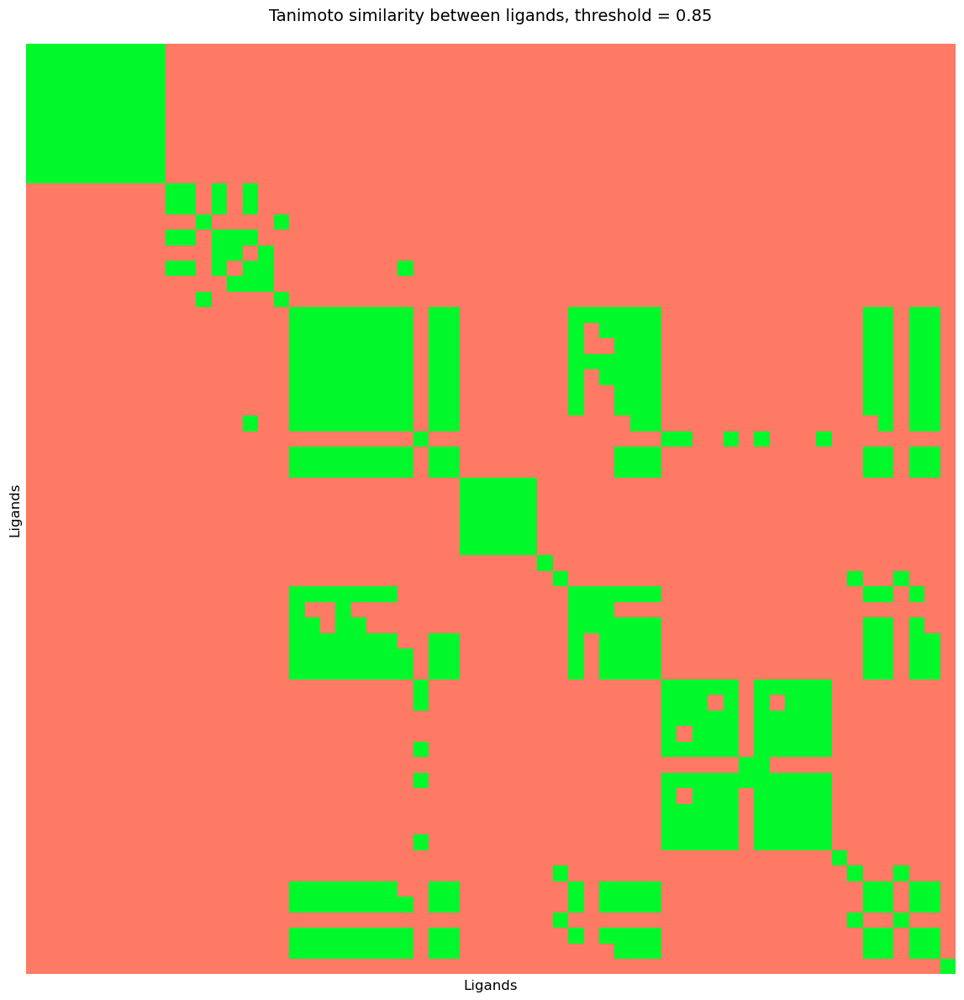

In [4013]:
cf.plot_conditional_tanimoto(similarity_matrix)

In [4014]:
summary_df = cf.summary_of_ligand_similarities(similarity_matrix)
summary_df

mean                                          0.581846
std                                           0.196745
min                                           0.338821
max                                           0.981869
no. similar ligands meas. >= 0.85           259.000000
no. of non-similar ligands meas. < 0.85    1499.000000
count                                      1758.000000
similar ligands %                            14.732651
dtype: float64

In [4015]:
strong_ligands_cdk_1_2_4 = IC50_ligand_strong[
    IC50_ligand_strong["Target Name"].isin(
        [
            "Cyclin-dependent kinase 1",
            "Cyclin-dependent kinase 2",
            "Cyclin-dependent kinase 4",
        ]
    )
][["BindingDB Ligand Name", "Ligand SMILES"]]



In [4016]:
strong_ligands_cdk_1_2_4.shape

(489, 2)

___

# Comparing similarities across ligands for CDK 1 & 4

In [4017]:
strong_ligands_cdk_1_4 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                "Target Name",
                                                               "Cyclin-dependent kinase 1",
                                                               "Cyclin-dependent kinase 4",
                                                               "BindingDB Ligand Name")
print(strong_ligands_cdk_1_4.shape)
strong_ligands_cdk_1_4.head()

(3, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(=O)(=O)C...,"US8802686, 1::US8802686, C1",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,12.0,strong,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(=O)(=O)C...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,36.0,strong
1,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(C)(=O)=O...,"US8802686, 2::US8802686, C2",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,6.5,strong,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(C)(=O)=O...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,29.5,strong
2,C[C@@H](Oc1nc(Nc2ccc(cc2)S(C)(=O)=O)ncc1C(F)(F...,"US8802686, 3::US8802686, C3",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,20.5,strong,C[C@@H](Oc1nc(Nc2ccc(cc2)S(C)(=O)=O)ncc1C(F)(F...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,51.0,strong


In [4018]:
cf.plot_tanimoto_similarity(strong_ligands_cdk_1_4)

ValueError: could not convert string to float: 'C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(=O)(=O)C2CC2)ncc1C(F)(F)F'

<Figure size 1600x1200 with 0 Axes>

___

# Comparing similarities across ligands for CDK 2 & 4


In [ ]:
strong_ligands_cdk_2_4 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                "Target Name",
                                                               "Cyclin-dependent kinase 2",
                                                               "Cyclin-dependent kinase 4",
                                                               "BindingDB Ligand Name")

print(strong_ligands_cdk_2_4.shape)
strong_ligands_cdk_2_4.head()

(3, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(=O)(=O)C...,"US8802686, 1::US8802686, C1",Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,11.0,strong,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(=O)(=O)C...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,36.0,strong
1,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(C)(=O)=O...,"US8802686, 2::US8802686, C2",Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,6.0,strong,C[C@@H](O)[C@@H](C)Oc1nc(Nc2ccc(cc2)S(C)(=O)=O...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,29.5,strong
2,C[C@@H](Oc1nc(Nc2ccc(cc2)S(C)(=O)=O)ncc1C(F)(F...,"US8802686, 3::US8802686, C3",Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,10.0,strong,C[C@@H](Oc1nc(Nc2ccc(cc2)S(C)(=O)=O)ncc1C(F)(F...,Cyclin-dependent kinase 4,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,51.0,strong


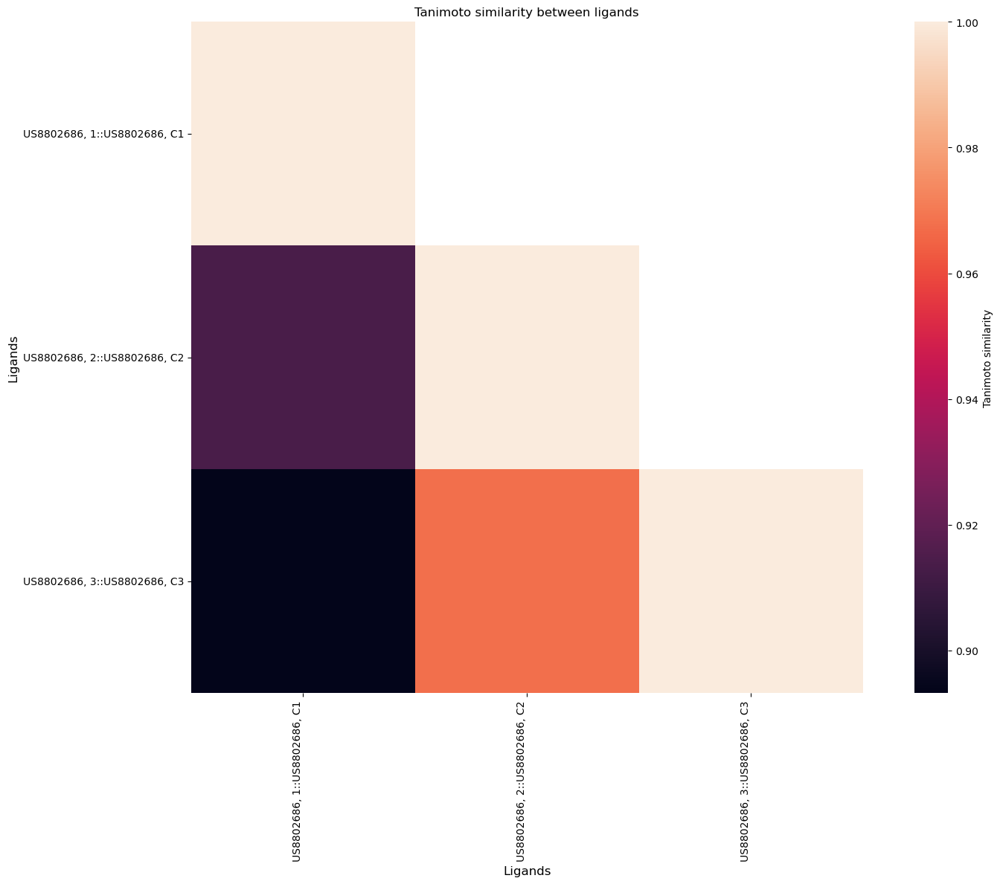

,"US8802686, 1::US8802686, C1","US8802686, 2::US8802686, C2","US8802686, 3::US8802686, C3"
"US8802686, 1::US8802686, C1",1.000000,0.913915,0.893226
"US8802686, 2::US8802686, C2",0.913915,1.000000,0.967541
"US8802686, 3::US8802686, C3",0.893226,0.967541,1.000000


In [ ]:
cf.plot_tanimoto_similarity(strong_ligands_cdk_2_4)

In [ ]:
df["Target Name"].unique()

array(['Cyclin-dependent kinase/G2/mitotic-specific cyclin- 1',
       'Cyclin-dependent kinase 2', 'Cyclin-dependent kinase 1',
       'Cyclin-dependent kinase 1/G2/mitotic-specific cyclin-B',
       'Cyclin-A2 [171-432]/Cyclin-dependent kinase 2',
       'Cyclin-dependent kinase 4/G1/S-specific cyclin-D1',
       'Cyclin-dependent kinase 2/G1/S-specific cyclin-E1',
       'Cyclin-dependent kinase 4/G1/S-specific cyclin-D1 [L188C]',
       'Cyclin-A2/Cyclin-dependent kinase 2',
       'Cyclin-dependent kinase 6/G1/S-specific cyclin-D1 [L188C]',
       'Cyclin-dependent kinase 5 activator 1 [99-307]',
       'Cyclin-dependent kinase 5 activator 1',
       'Cyclin-dependent kinase 4', 'Cyclin-H/Cyclin-dependent kinase 7',
       'Cyclin-T1/Cyclin-dependent kinase 9',
       'Cyclin-A2 [171-432]/Cyclin-dependent kinase 2 [K89T]',
       'Cyclin-A2 [171-432]/Cyclin-dependent kinase 2 [L83V,H84D]',
       'Cyclin-A2 [171-432]/Cyclin-dependent kinase 2 [F82H]',
       'Cyclin-A2 [171-432]/C

___

# Comparing between Cyclin-A2/Cyclin-dependent kinase 2 & Cyclin-dependent kinase 2/G1/S-specific cyclin-E1


In [4030]:
IC50_ligand_strong

,Ligand SMILES,BindingDB Ligand Name,Target Name,Target Source Organism According to Curator or DataSource,BindingDB Target Chain Sequence,UniProt (SwissProt) Entry Name of Target Chain,IC50 (nM),IC50_class
8,Brc1cc2cnc(Nc3ccc(cn3)N3CCNCC3)nc2n(C2CCCC2)c1=O,6-Bromo-8-cyclopentyl-2-(5-piperazin-1-yl-pyri...,Cyclin-dependent kinase 4/G1/S-specific cyclin...,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,16.0,strong
15,Brc1ccc(cc1)C(=O)Nc1cc(n[nH]1)C1CC1,3-Benzamidoaminopyrazole deriv. 5::4-bromo-N-(...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,34.0,strong
16,Brc1ccc(cc1)C(=O)Nc1cc(n[nH]1)C1CCC1,3-Benzamidoaminopyrazole deriv. 19::4-bromo-N-...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,90.0,strong
17,Brc1ccc(cc1)C(=O)Nc1cc(n[nH]1)C1CCCC1,3-Benzamidoaminopyrazole deriv. 20::4-bromo-N-...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,50.0,strong
43,Brc1ccc2c(c1)[nH]c1c2c2C(=O)NC(=O)c2c2c3cccc4C...,"1,7-Annulated indolocarbazole deriv. 6l::7-bro...",Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,90.0,strong
...,...,...,...,...,...,...,...,...
5844,[O-][N+](=O)c1ccc2[nH]c-3c(CC(=O)Nc4ccccc-34)c2c1,"14-nitro-8,18-diazatetracyclo[9.7.0.0^{2,7}.0^...",Cyclin-dependent kinase 1,Homo sapiens,MEDYTKIEKIGEGTYGVVYKGRHKTTGQVVAMKKIRLESEEEGVPS...,CDK1_HUMAN,35.0,strong
5845,[O-][N+](=O)c1ccc2[nH]c-3c(CC(=O)Nc4ccccc-34)c2c1,"14-nitro-8,18-diazatetracyclo[9.7.0.0^{2,7}.0^...",Cyclin-dependent kinase 1/G2/mitotic-specific ...,Marthasterias glacialis,MEDYVKIEKIGEGTYGVVYKGRHKSTGQVVAMKKIRLESEEEGVPS...,CDK1_ORYLA,35.0,strong
5846,[O-][N+](=O)c1ccc2[nH]c-3c(CC(=O)Nc4ccccc-34)c2c1,"14-nitro-8,18-diazatetracyclo[9.7.0.0^{2,7}.0^...",Cyclin-dependent kinase 5,Homo sapiens,MQKYEKLEKIGEGTYGTVFKAKNRETHEIVALKRVRLDDDDEGVPS...,CDK5_HUMAN,40.0,strong
5847,[O-][N+](=O)c1ccc2[nH]c-3c(CC(=O)Nc4ccsc-34)c2c1,"13-nitro-3-thia-7,17-diazatetracyclo[8.7.0.0^{...",Cyclin-dependent kinase 1/G2/mitotic-specific ...,Marthasterias glacialis,MEDYVKIEKIGEGTYGVVYKGRHKSTGQVVAMKKIRLESEEEGVPS...,CDK1_ORYLA,80.0,strong


In [ ]:
strong_ligands_cdks_2 = cf.create_df_on_intersection_of_values(
    IC50_ligand_strong,
    "Target Name",
    "Cyclin-A2/Cyclin-dependent kinase 2",
    "Cyclin-dependent kinase 2/G1/S-specific cyclin-E1",
    "BindingDB Ligand Name"
)

In [ ]:
print(strong_ligands_cdks_2.shape)
strong_ligands_cdks_2.head()

(8, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,CCCCNC(=O)N1Cc2n[nH]c(NC(=O)Cc3ccc(cc3)N3CCCC3...,"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazo...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,33.0,strong,CCCCNC(=O)N1Cc2n[nH]c(NC(=O)Cc3ccc(cc3)N3CCCC3...,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,91.0,strong
1,CCCCNC(=O)N1Cc2n[nH]c(NC(=O)[C@@H](C)c3ccc4ccc...,"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazo...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,36.0,strong,CCCCNC(=O)N1Cc2n[nH]c(NC(=O)[C@@H](C)c3ccc4ccc...,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,90.0,strong
2,CCCCn1c2nc(Nc3ccccc3)ncc2ccc1=O,"8-Butyl-2-phenylamino-8H-pyrido[2,3-d]pyrimidi...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,37.0,strong,CCCCn1c2nc(Nc3ccccc3)ncc2ccc1=O,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,58.0,strong
3,CN1CCN(CC1)c1ccc(Nc2ncc3ccc(=O)n(C4CCCC4)c3n2)cc1,8-Cyclopentyl-2-[4-(4-methylpiperazin-1-yl)phe...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,14.0,strong,CN1CCN(CC1)c1ccc(Nc2ncc3ccc(=O)n(C4CCCC4)c3n2)cc1,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,39.0,strong
4,CN1CCN(CC1)c1ccc(Nc2ncc3ccc(=O)n(C4CCCCC4)c3n2...,8-Cyclohexyl-2-[4-(4-methylpiperazin-1-yl)phen...,Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,15.0,strong,CN1CCN(CC1)c1ccc(Nc2ncc3ccc(=O)n(C4CCCCC4)c3n2...,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,20.0,strong


In [ ]:
similarity_matrix_cdks_2 = cf.ligand_similarity_matrix(strong_ligands_cdks_2)

In [ ]:
similarity_matrix_cdks_2.head()

,"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazole 15::N-butyl-3-{2-[4-(pyrrolidin-1-yl)phenyl]acetamido}-1H,4H,5H,6H-pyrrolo[3,4-c]pyrazole-5-carboxamide","3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazole 18::N-butyl-3-[(2S)-2-(naphthalen-2-yl)propanamido]-1H,4H,5H,6H-pyrrolo[3,4-c]pyrazole-5-carboxamide","8-Butyl-2-phenylamino-8H-pyrido[2,3-d]pyrimidin-7-one::8-butyl-2-(phenylamino)-7H,8H-pyrido[2,3-d]pyrimidin-7-one::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 42","8-Cyclopentyl-2-[4-(4-methylpiperazin-1-yl)phenylamino]-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclopentyl-2-{[4-(4-methylpiperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::FRAX019::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 68::Pyrido[2,3-d]pyrimidin-7-one 1","8-Cyclohexyl-2-[4-(4-methylpiperazin-1-yl)phenylamino]-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclohexyl-2-{[4-(4-methylpiperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 70",(N-(5-cyclopropyl-1H-pyrazol-3-yl)-2-(2-naphthyl)acetamide::N-(5-cyclopropyl-1H-pyrazol-3-yl)-2-(naphthalen-2-yl)acetamide::PNU-292137,"8-Cyclopentyl-2-(4-piperazin-1-yl-phenylamino)-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclopentyl-2-{[4-(piperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::Pyrido[2,3-d]pyrimidin-7-one 5","8-Cyclopentyl-2-(4-morpholin-4-yl-phenylamino)-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclopentyl-2-{[4-(morpholin-4-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::Pyrido[2,3-d]pyrimidin-7-one 2"
"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazole 15::N-butyl-3-{2-[4-(pyrrolidin-1-yl)phenyl]acetamido}-1H,4H,5H,6H-pyrrolo[3,4-c]pyrazole-5-carboxamide",1.000000,0.858595,0.311047,0.373269,0.373010,0.407609,0.370474,0.373955
"3-Amino-1,4,5,6-tetrahydropyrrolo[3,4-c]pyrazole 18::N-butyl-3-[(2S)-2-(naphthalen-2-yl)propanamido]-1H,4H,5H,6H-pyrrolo[3,4-c]pyrazole-5-carboxamide",0.858595,1.000000,0.315827,0.361356,0.361111,0.442009,0.358555,0.359184
"8-Butyl-2-phenylamino-8H-pyrido[2,3-d]pyrimidin-7-one::8-butyl-2-(phenylamino)-7H,8H-pyrido[2,3-d]pyrimidin-7-one::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 42",0.311047,0.315827,1.000000,0.819192,0.818365,0.238267,0.831795,0.827551
"8-Cyclopentyl-2-[4-(4-methylpiperazin-1-yl)phenylamino]-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclopentyl-2-{[4-(4-methylpiperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::FRAX019::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 68::Pyrido[2,3-d]pyrimidin-7-one 1",0.373269,0.361356,0.819192,1.000000,0.990955,0.260976,0.984848,0.931373
"8-Cyclohexyl-2-[4-(4-methylpiperazin-1-yl)phenylamino]-8H-pyrido[2,3-d]pyrimidin-7-one::8-cyclohexyl-2-{[4-(4-methylpiperazin-1-yl)phenyl]amino}-7H,8H-pyrido[2,3-d]pyrimidin-7-one::N8 Pyrido[2,3-d]pyrimidin-7-one deriv. 70",0.373010,0.361111,0.818365,0.990955,1.000000,0.261789,0.975879,0.924805


/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


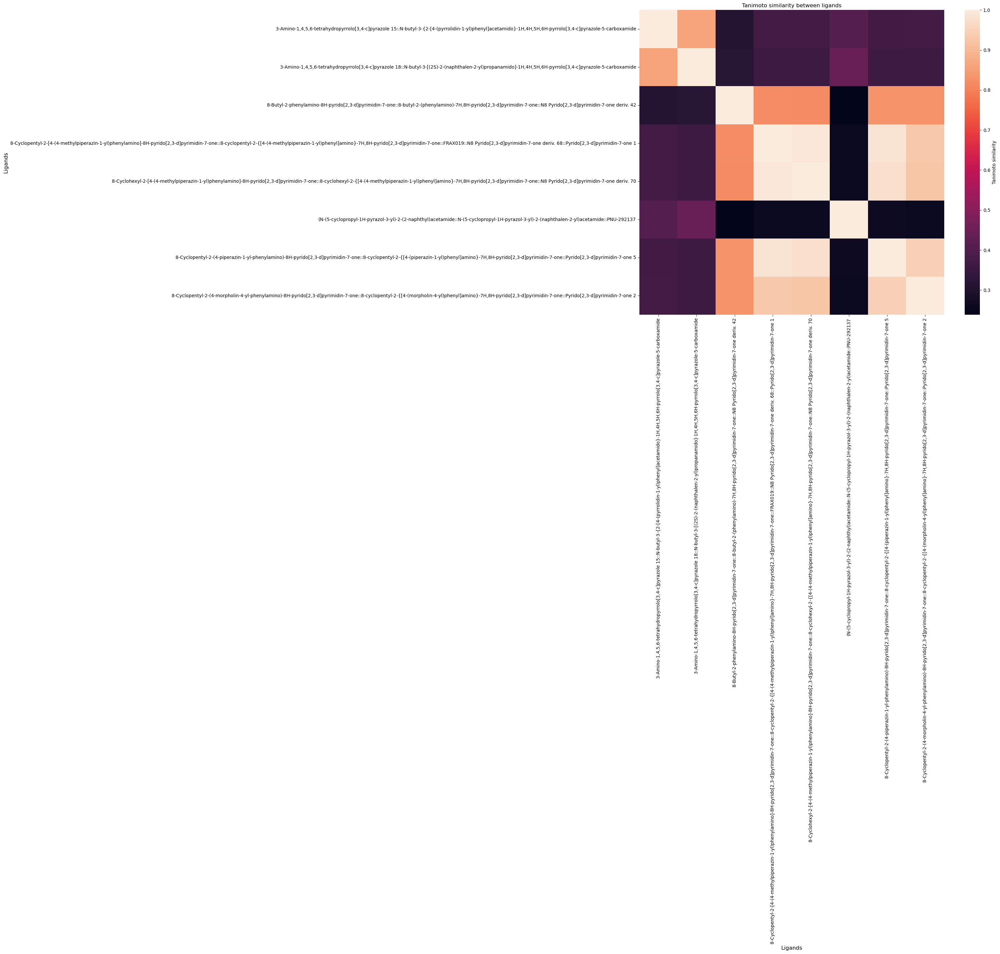

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_cdks_2)

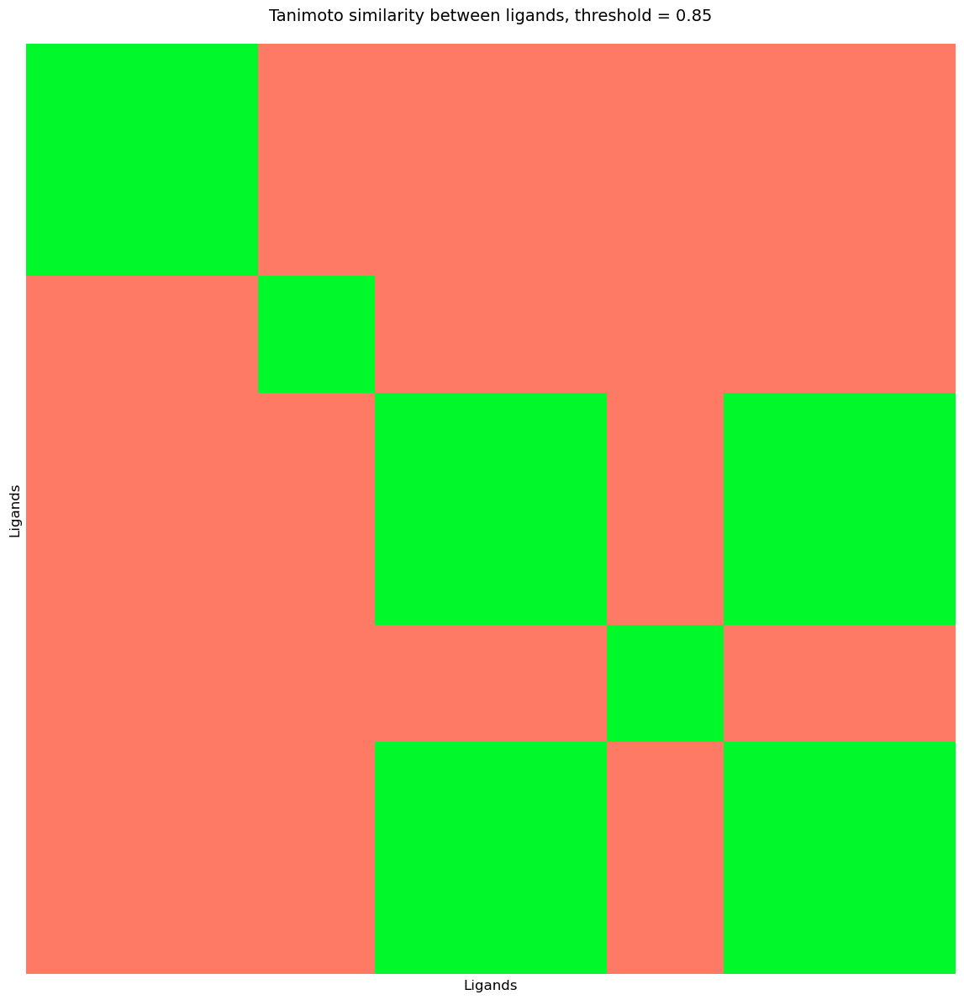

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_cdks_2)

In [ ]:
summary_df_cdks_2 = cf.summary_of_ligand_similarities(similarity_matrix_cdks_2)
summary_df_cdks_2

mean                                        0.557152
std                                         0.283217
min                                         0.238267
max                                         0.990955
no. similar ligands meas. >= 0.85           7.000000
no. of non-similar ligands meas. < 0.85    21.000000
count                                      28.000000
similar ligands %                          25.000000
dtype: float64

___

# Comparing between Cyclin-A2/Cyclin-dependent kinase 2 & Cyclin-dependent kinase 4/G1/S-specific cyclin-D1


In [ ]:
strong_ligands_cdk_2_4 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                "Target Name",
                                                               "Cyclin-A2/Cyclin-dependent kinase 2",
                                                               "Cyclin-dependent kinase 4/G1/S-specific cyclin-D1",
                                                                "BindingDB Ligand Name")

In [ ]:
print(strong_ligands_cdk_2_4.shape)
strong_ligands_cdk_2_4.head()

(9, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,C1COc2cc(Nc3nccc(n3)-c3cnn4ncccc34)ccc2O1,"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{pyrazo...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,6.0,strong,C1COc2cc(Nc3nccc(n3)-c3cnn4ncccc34)ccc2O1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,15.0,strong
1,COC1CC(OC)=CC(C1)=Nc1nccc(n1)-c1cnn2ncccc12,"N-(3,5-dimethoxycyclohexa-1,3-dien-1-yl)-4-{py...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,15.0,strong,COC1CC(OC)=CC(C1)=Nc1nccc(n1)-c1cnn2ncccc12,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,19.0,strong
2,COc1cccc(Nc2nccc(n2)-c2cnn3ncccc23)c1,"N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazi...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,2.0,strong,COc1cccc(Nc2nccc(n2)-c2cnn3ncccc23)c1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,63.0,strong
3,Cc1ccc2c(cnn2n1)-c1ccnc(Nc2ccc3OCCOc3c2)n1,"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{6-meth...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,6.0,strong,Cc1ccc2c(cnn2n1)-c1ccnc(Nc2ccc3OCCOc3c2)n1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,79.0,strong
4,Cc1ccc2c(cnn2n1)-c1ccnc(Nc2cccc(c2)C(F)(F)F)n1,"4-(6-Methylpyrazolo[1,5-b]pyridazin-3-yl)-N-[3...",Cyclin-A2/Cyclin-dependent kinase 2,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,50.0,strong,Cc1ccc2c(cnn2n1)-c1ccnc(Nc2cccc(c2)C(F)(F)F)n1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,31.0,strong


In [ ]:
similarity_matrix_cdk_2_4 = cf.ligand_similarity_matrix(strong_ligands_cdk_2_4)

In [ ]:
p

/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


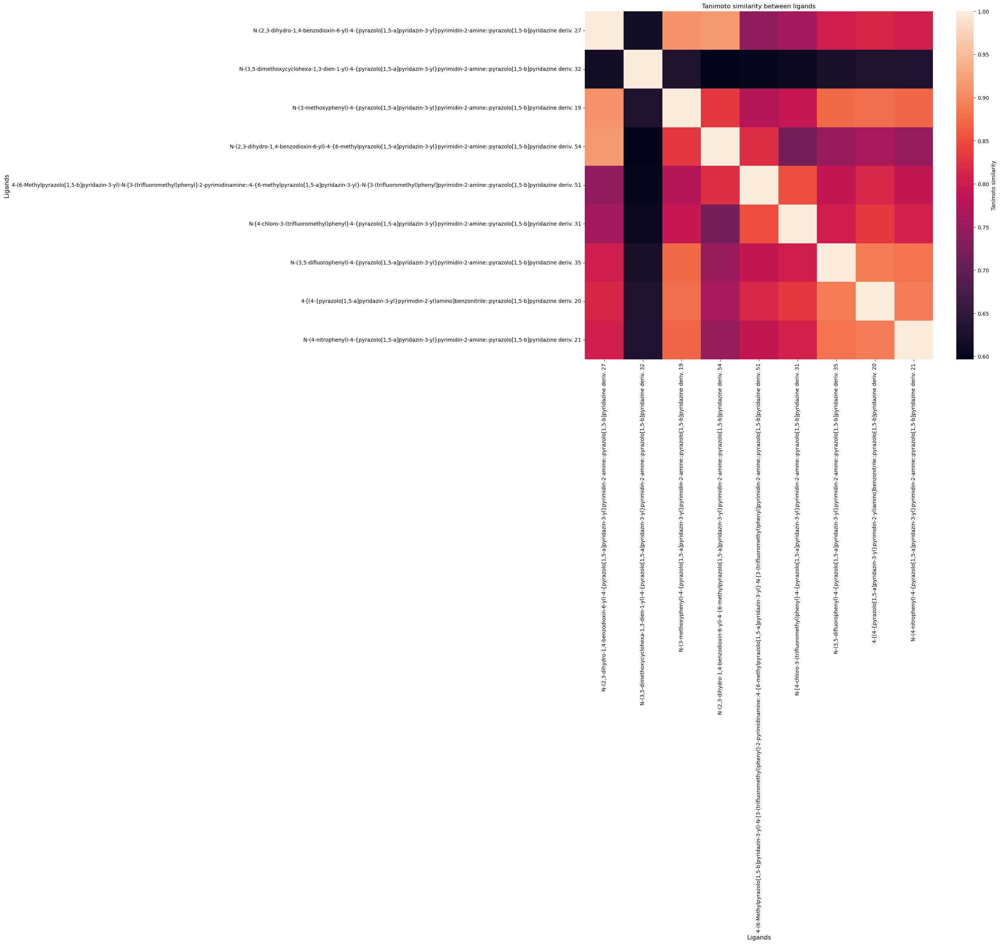

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_cdk_2_4)

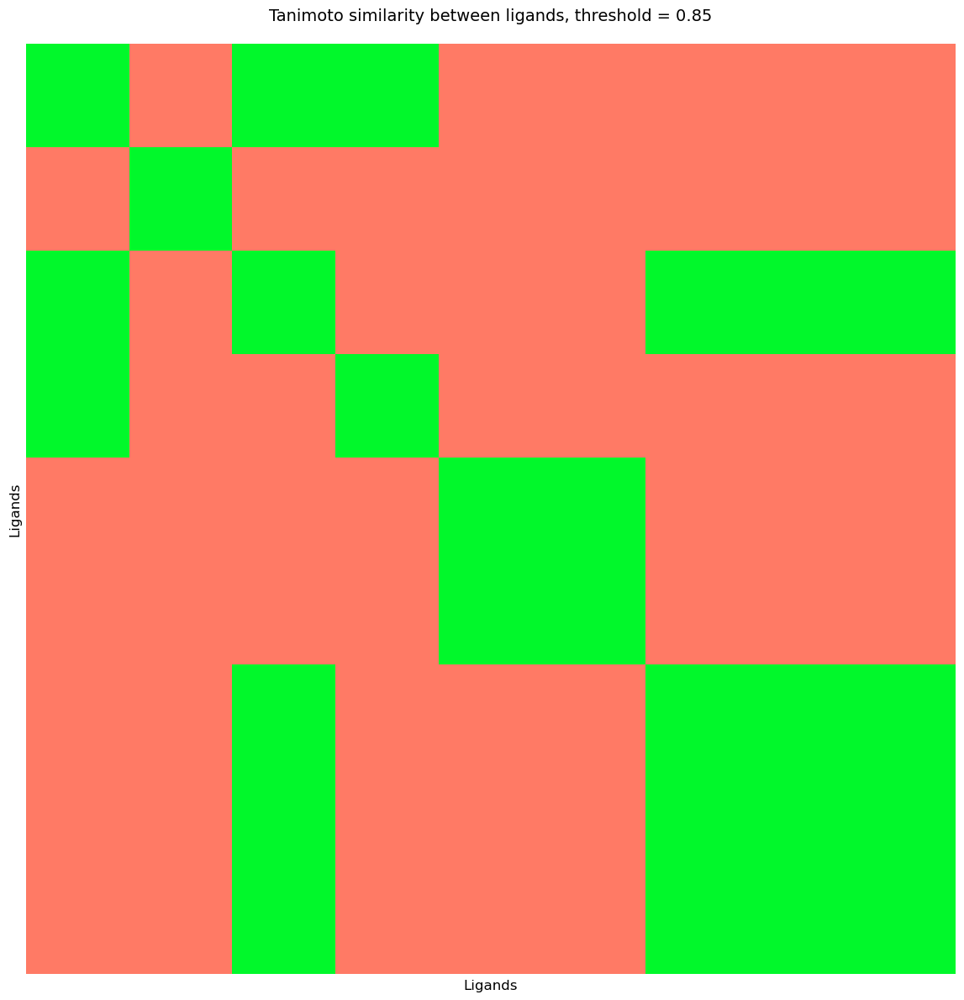

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_cdk_2_4)

___
# Comparing between Cyclin-dependent kinase 2/G1/S-specific cyclin-E1 & Cyclin-dependent kinase 4/G1/S-specific cyclin-D1


In [ ]:
strong_ligands_cdk_24 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                               "Target Name",
                                                                "Cyclin-dependent kinase 2/G1/S-specific cyclin-E1",
                                                                "Cyclin-dependent kinase 4/G1/S-specific cyclin-D1",
                                                                "BindingDB Ligand Name")


In [ ]:
print(strong_ligands_cdk_24["BindingDB Ligand Name"].unique())

['2-aminothiazole 6::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-phenyl-1,3-thiazol-2-amine'
 '2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-(pyridin-2-yl)-1,3-thiazol-2-amine'
 '2-aminothiazole 9::5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-N-(pyrimidin-4-yl)-1,3-thiazol-2-amine'
 '2-aminothiazole deriv.::3-[({6-[(5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-1,3-thiazol-2-yl)amino]pyridin-3-yl}methyl)amino]-2,2-dimethylpropan-1-ol::BMS-357075'
 '2-amino-5-thio-substituted thiazole 29::N-(5-{[(5-tert-butyl-1,3-oxazol-2-yl)methyl]sulfanyl}-1,3-thiazol-2-yl)-2-methylpropanamide::N-[5-[[[5-tert-Butyl-2-oxazolyl]methyl]thio]-2-thiazolyl]-2-isopropylamide'
 '3-(3-{5-[(4-ethyl-1,4-diazepan-1-yl)carbonyl]thiophen-2-yl}-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl)-1-morpholin-4-ylurea::C3 thienylamide indenopyrazole 10q'
 '3-(3-{5-[(4-ethylpiperazin-1-yl)carbonyl]thiophen-2-yl}-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl)-1-morpholin-4-ylurea::C3 thienylamid

In [ ]:
print(strong_ligands_cdk_24.shape)
strong_ligands_cdk_24.head()

(95, 15)


,Ligand SMILES_x,BindingDB Ligand Name,Target Name_x,Target Source Organism According to Curator or DataSource_x,BindingDB Target Chain Sequence_x,UniProt (SwissProt) Entry Name of Target Chain_x,IC50 (nM)_x,IC50_class_x,Ligand SMILES_y,Target Name_y,Target Source Organism According to Curator or DataSource_y,BindingDB Target Chain Sequence_y,UniProt (SwissProt) Entry Name of Target Chain_y,IC50 (nM)_y,IC50_class_y
0,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccc3)s2)o1,"2-aminothiazole 6::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,4.0,strong,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccc3)s2)o1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,78.0,strong
1,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccn3)s2)o1,"2-aminothiazole 7::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,2.0,strong,CC(C)(C)c1cnc(CSc2cnc(Nc3ccccn3)s2)o1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,9.0,strong
2,CC(C)(C)c1cnc(CSc2cnc(Nc3ccncn3)s2)o1,"2-aminothiazole 9::5-{[(5-tert-butyl-1,3-oxazo...",Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,1.0,strong,CC(C)(C)c1cnc(CSc2cnc(Nc3ccncn3)s2)o1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,30.0,strong
3,CC(C)(CO)CNCc1ccc(Nc2ncc(SCc3ncc(o3)C(C)(C)C)s...,2-aminothiazole deriv.::3-[({6-[(5-{[(5-tert-b...,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,3.0,strong,CC(C)(CO)CNCc1ccc(Nc2ncc(SCc3ncc(o3)C(C)(C)C)s...,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,26.0,strong
4,CC(C)C(=O)Nc1ncc(SCc2ncc(o2)C(C)(C)C)s1,2-amino-5-thio-substituted thiazole 29::N-(5-{...,Cyclin-dependent kinase 2/G1/S-specific cyclin-E1,Homo sapiens,MENFQKVEKIGEGTYGVVYKARNKLTGEVVALKKIRLDTETEGVPS...,CDK2_HUMAN,5.0,strong,CC(C)C(=O)Nc1ncc(SCc2ncc(o2)C(C)(C)C)s1,Cyclin-dependent kinase 4/G1/S-specific cyclin-D1,Homo sapiens,MATSRYEPVAEIGVGAYGTVYKARDPHSGHFVALKSVRVPNGGGGG...,CDK4_HUMAN,30.0,strong


In [ ]:
similarity_matrix_cdk_24 = cf.ligand_similarity_matrix(strong_ligands_cdk_24)

/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


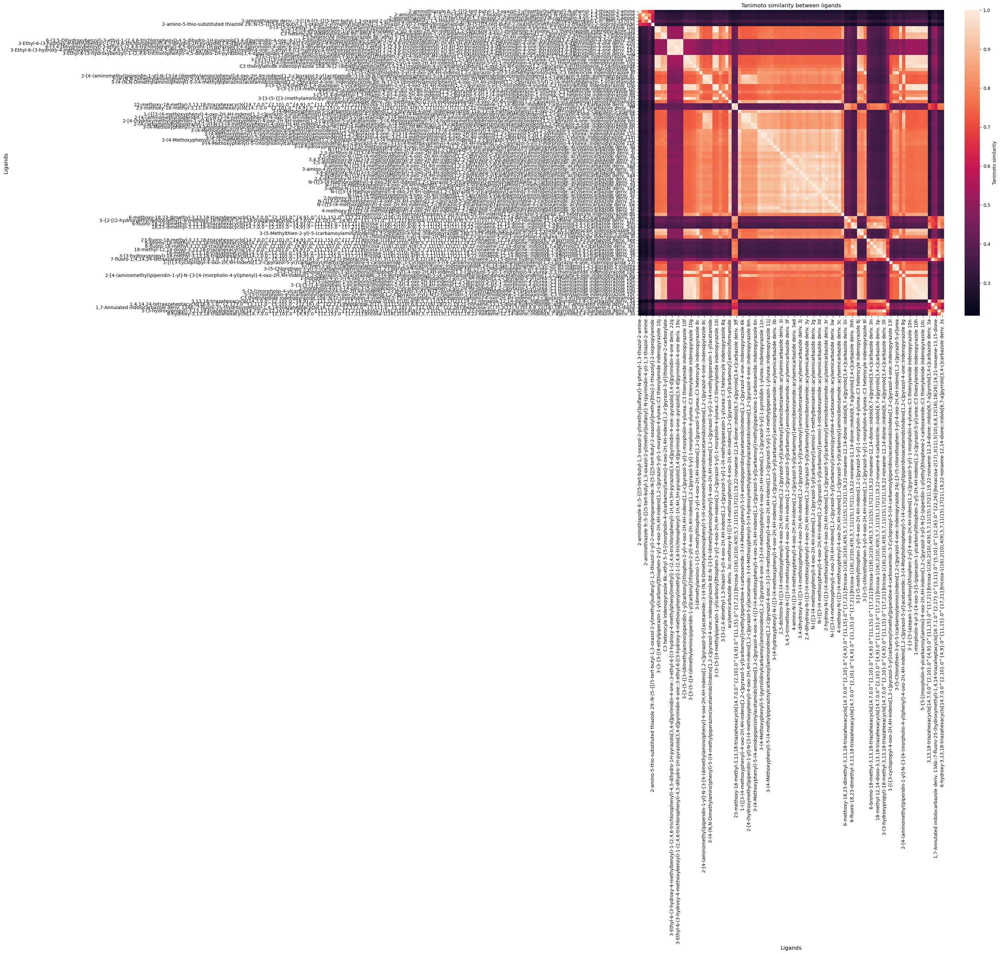

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_cdk_24)

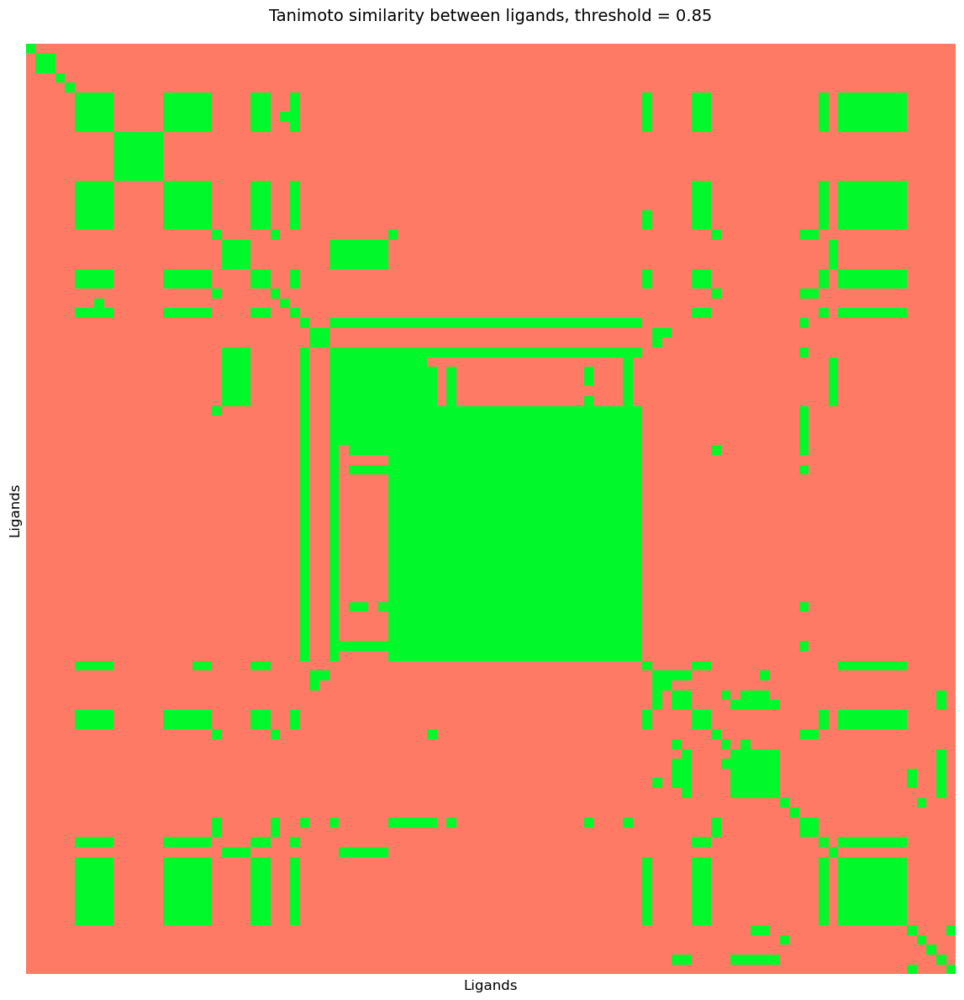

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_cdk_24)

In [ ]:
summary_df_cdk_24 = cf.summary_of_ligand_similarities(similarity_matrix_cdk_24)

In [ ]:
summary_df_cdk_24

mean                                          0.621003
std                                           0.229844
min                                           0.216028
max                                           0.998876
no. similar ligands meas. >= 0.85           785.000000
no. of non-similar ligands meas. < 0.85    3680.000000
count                                      4465.000000
similar ligands %                            17.581187
dtype: float64

### Comparison of ligands based on their binding affinity to CDKs

For this section of the analysis we constructed the `hypothesis` that if 2 CDKs stem from the same family, their interaction with ligands will be similar.

Firstly, we interpreted the interaction array. For Project M2 the interpretation of the ineraction array was done by visually analyzing the heatmap of ligannds v CDKs.




____ 
# Comaparison between 2 different UniProt Entry Names of Target Chain CDK1_HUMAN and CDK2_HUMAN, CDK1_HUMAN and CDK4_HUMAN, CDK2_HUMAN and CDK4_HUMAN

In [ ]:
strong_ligands_uniprot_cdk_1_2 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                          "UniProt (SwissProt) Entry Name of Target Chain",
                                                                          "CDK1_HUMAN",
                                                                          "CDK2_HUMAN",
                                                                          "BindingDB Ligand Name")

strong_ligands_uniprot_cdk_1_4 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                        "UniProt (SwissProt) Entry Name of Target Chain",
                                                                        "CDK1_HUMAN",
                                                                        "CDK4_HUMAN",
                                                                        "BindingDB Ligand Name")

strong_ligands_uniprot_cdk_2_4 = cf.create_df_on_intersection_of_values(IC50_ligand_strong,
                                                                        "UniProt (SwissProt) Entry Name of Target Chain",
                                                                        "CDK2_HUMAN",
                                                                        "CDK4_HUMAN",
                                                                        "BindingDB Ligand Name")




In [ ]:
print(strong_ligands_uniprot_cdk_1_2.shape)
print(strong_ligands_uniprot_cdk_1_4.shape)
print(strong_ligands_uniprot_cdk_2_4.shape)

(106, 15)
(10, 15)
(122, 15)


In [ ]:
similarity_matrix_uniprot_cdk_1_2 = cf.ligand_similarity_matrix(strong_ligands_uniprot_cdk_1_2)
similarity_matrix_uniprot_cdk_1_4 = cf.ligand_similarity_matrix(strong_ligands_uniprot_cdk_1_4)
similarity_matrix_uniprot_cdk_2_4 = cf.ligand_similarity_matrix(strong_ligands_uniprot_cdk_2_4)


/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


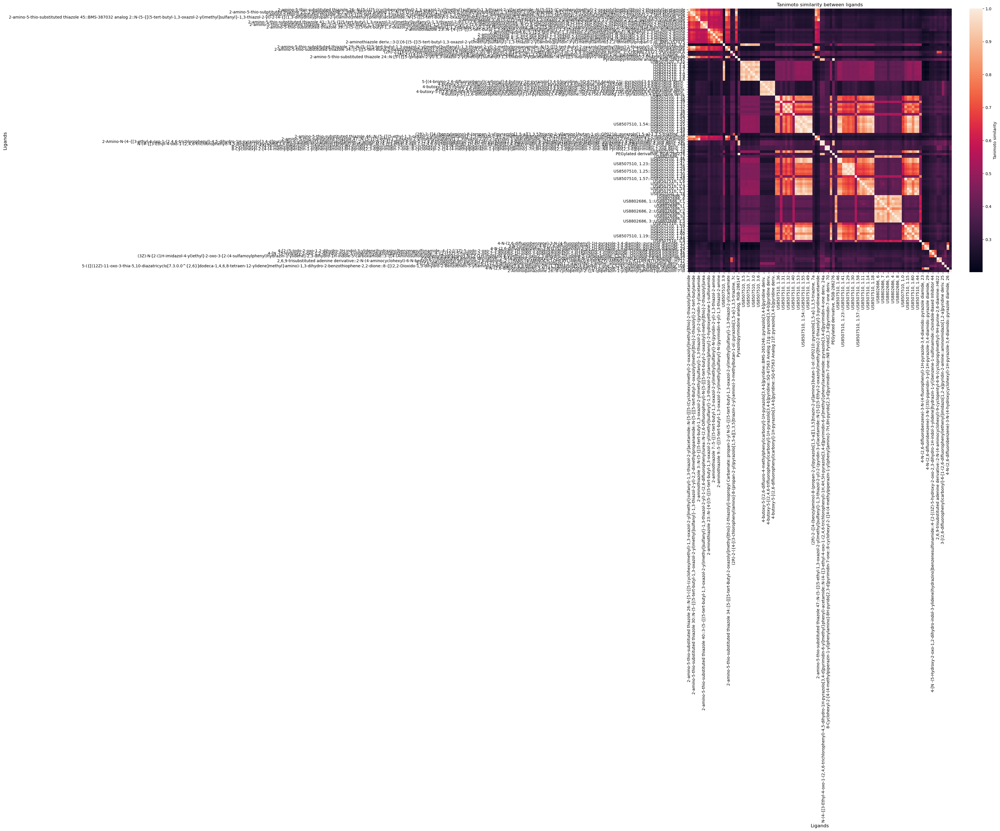

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_uniprot_cdk_1_2)

/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


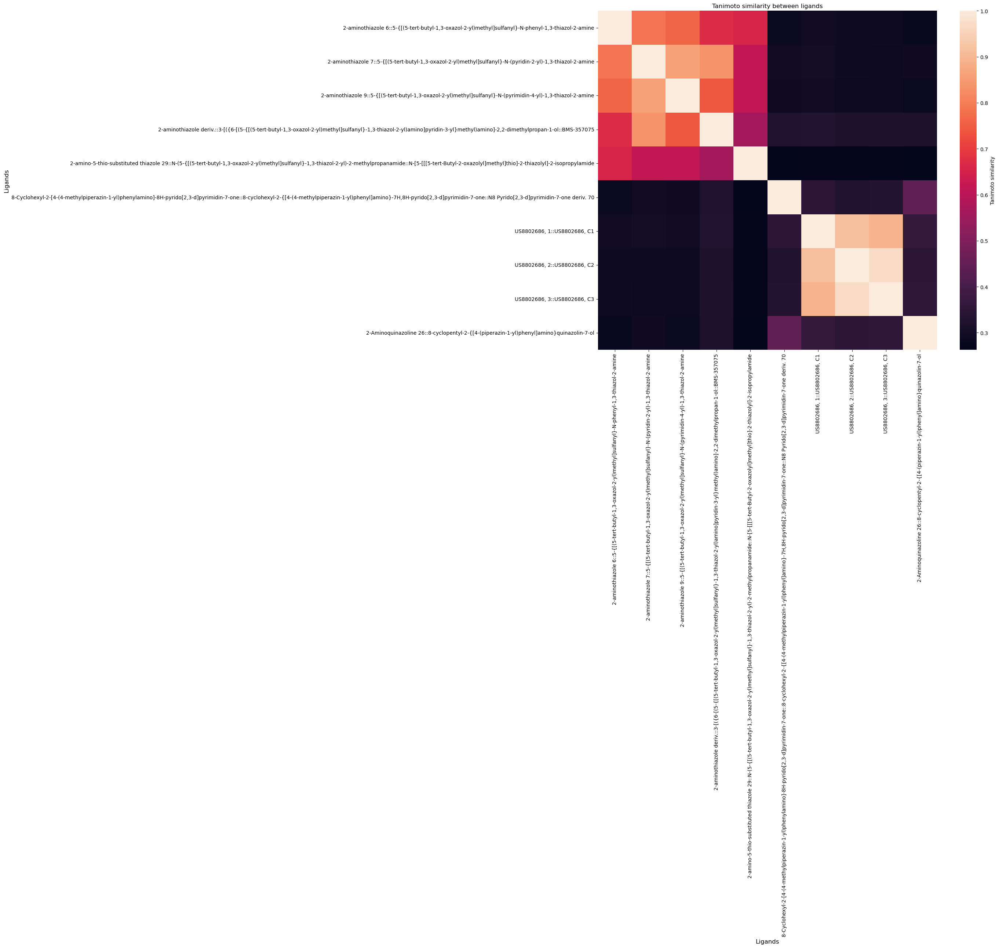

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_uniprot_cdk_1_4)

/Users/mathiasmarkvardsen/adaProject/ada-2024-project-forzada/src/scripts/cheekyfunctions.py:126: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


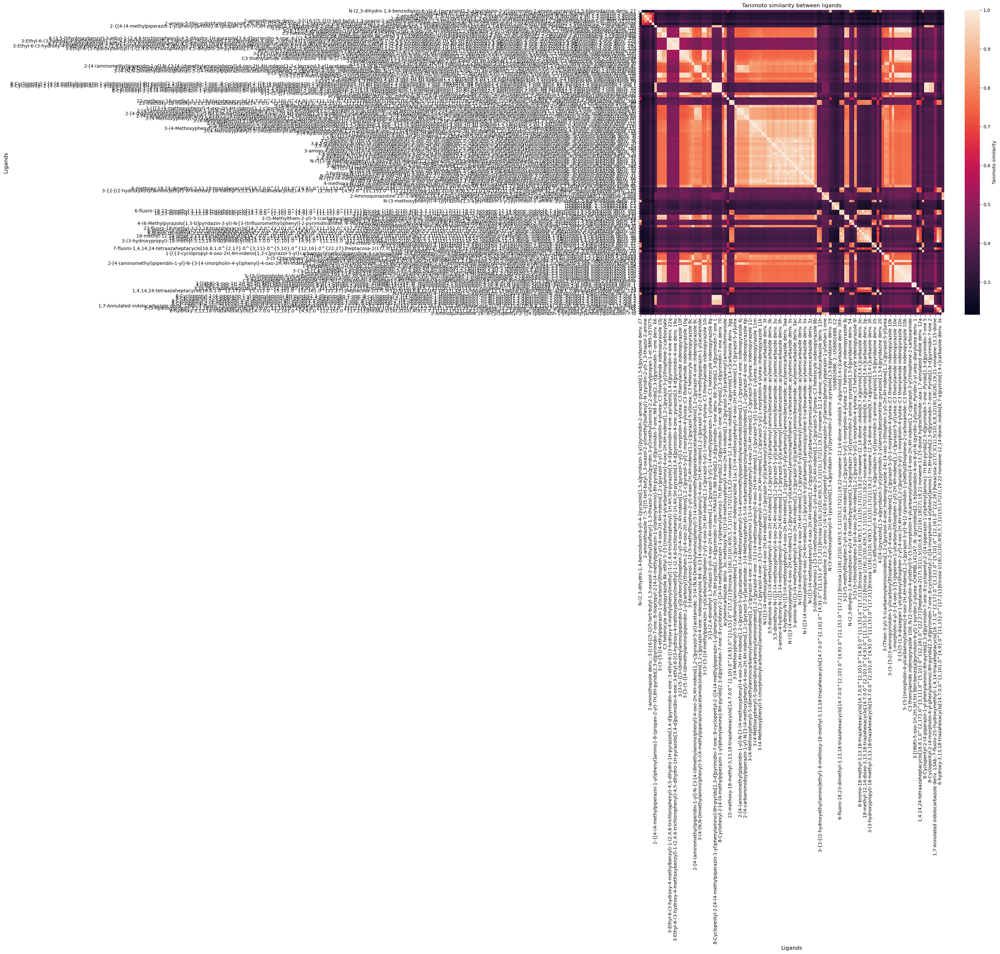

In [ ]:
cf.plot_tanimoto_similarity(similarity_matrix_uniprot_cdk_2_4)

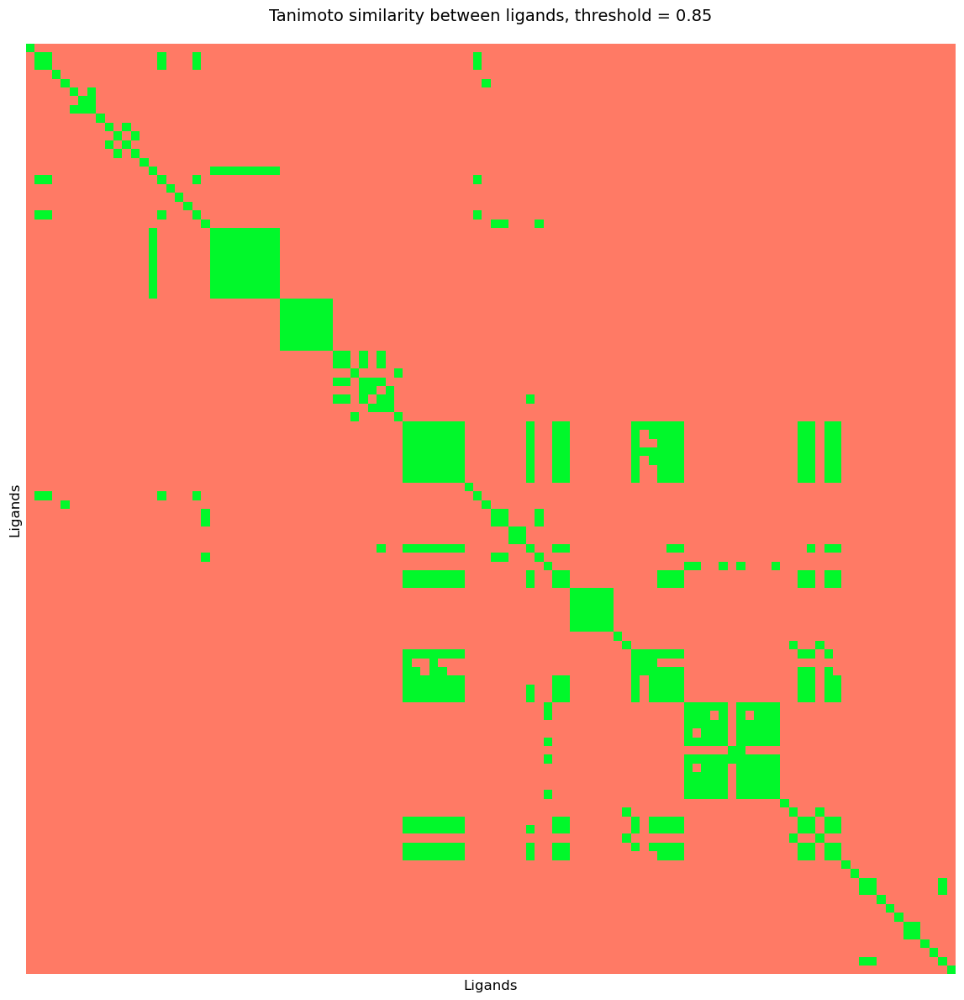

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_uniprot_cdk_1_2)

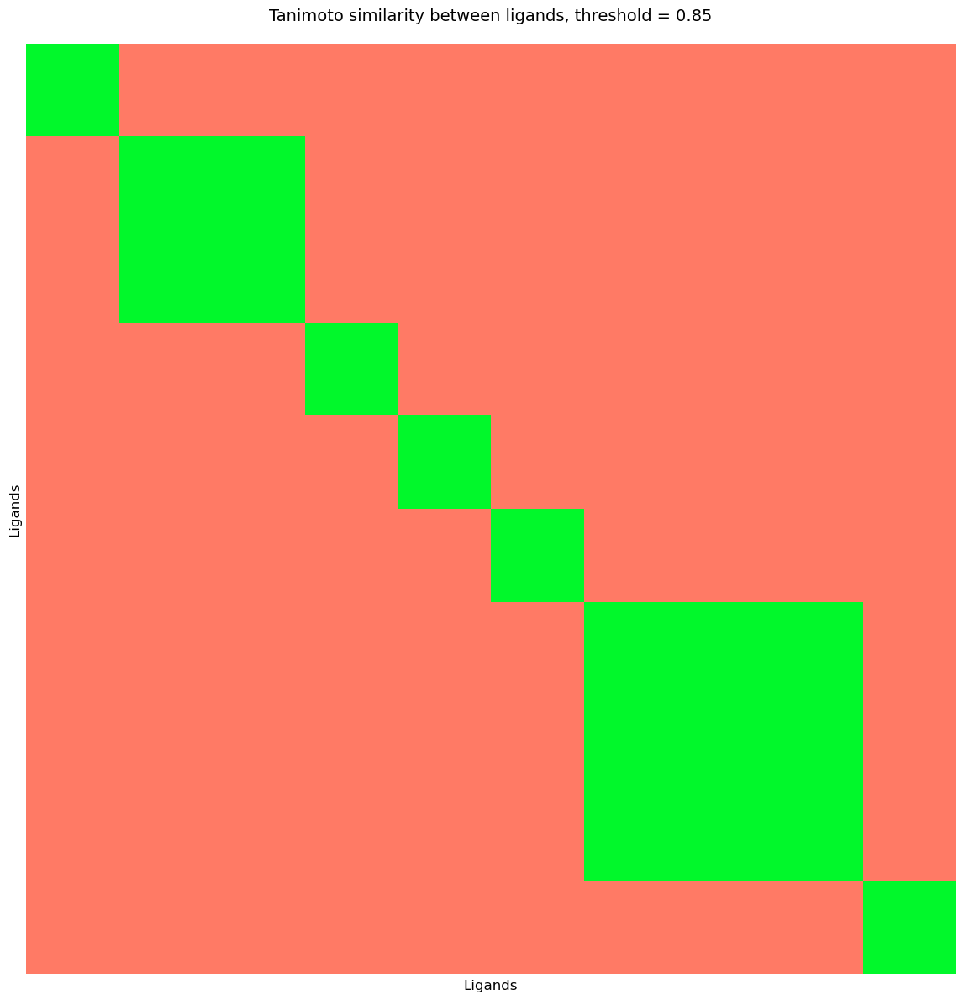

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_uniprot_cdk_1_4)

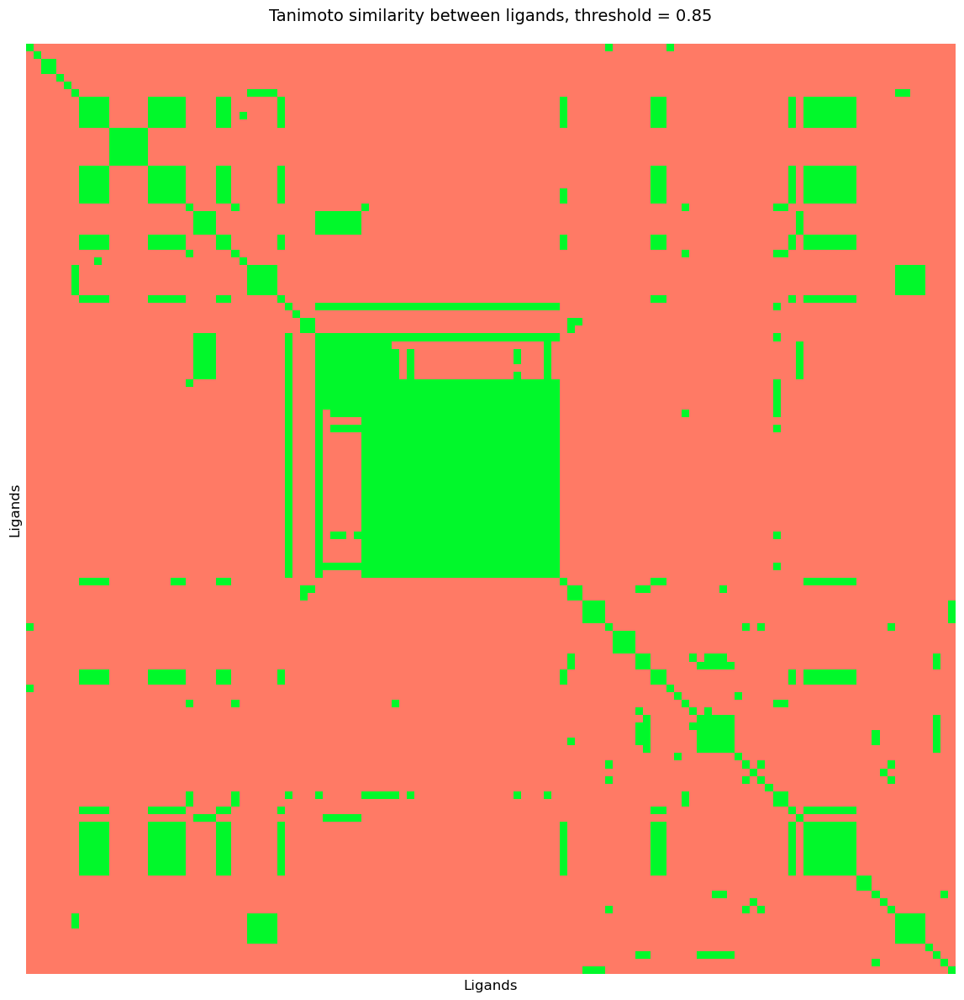

In [ ]:
cf.plot_conditional_tanimoto(similarity_matrix_uniprot_cdk_2_4)

In [ ]:
summary_df_uniprot_cdk_1_2 = cf.summary_of_ligand_similarities(similarity_matrix_uniprot_cdk_1_2)
summary_df_uniprot_cdk_1_4 = cf.summary_of_ligand_similarities(similarity_matrix_uniprot_cdk_1_4)
summary_df_uniprot_cdk_2_4 = cf.summary_of_ligand_similarities(similarity_matrix_uniprot_cdk_2_4)


In [ ]:
summary_df_uniprot_cdk_1_2

mean                                          0.406204
std                                           0.184458
min                                           0.200333
max                                           0.990819
no. similar ligands meas. >= 0.85           299.000000
no. of non-similar ligands meas. < 0.85    5253.000000
count                                      5552.000000
similar ligands %                             5.385447
dtype: float64

In [ ]:
summary_df_uniprot_cdk_1_4

mean                                        0.437454
std                                         0.218599
min                                         0.262491
max                                         0.967541
no. similar ligands meas. >= 0.85           4.000000
no. of non-similar ligands meas. < 0.85    41.000000
count                                      45.000000
similar ligands %                           8.888889
dtype: float64

In [ ]:
summary_df_uniprot_cdk_2_4

mean                                          0.528750
std                                           0.219984
min                                           0.216028
max                                           0.998876
no. similar ligands meas. >= 0.85           833.000000
no. of non-similar ligands meas. < 0.85    6543.000000
count                                      7376.000000
similar ligands %                            11.293384
dtype: float64

In [ ]:
similarity_matrix_cdk_2_4.head()

,"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 27","N-(3,5-dimethoxycyclohexa-1,3-dien-1-yl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 32","N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 19","N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{6-methylpyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 54","4-(6-Methylpyrazolo[1,5-b]pyridazin-3-yl)-N-[3-(trifluoromethyl)phenyl]-2-pyrimidinamine::4-{6-methylpyrazolo[1,5-a]pyridazin-3-yl}-N-[3-(trifluoromethyl)phenyl]pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 51","N-[4-chloro-3-(trifluoromethyl)phenyl]-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 31","N-(3,5-difluorophenyl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 35","4-[(4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-yl)amino]benzonitrile::pyrazolo[1,5-b]pyridazine deriv. 20","N-(4-nitrophenyl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 21"
"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 27",1.000000,0.616337,0.909187,0.914976,0.743427,0.759036,0.804020,0.813576,0.804829
"N-(3,5-dimethoxycyclohexa-1,3-dien-1-yl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 32",0.616337,1.000000,0.628696,0.596724,0.601934,0.606383,0.624454,0.628622,0.633568
"N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 19",0.909187,0.628696,1.000000,0.831884,0.774879,0.792285,0.873904,0.876652,0.868709
"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{6-methylpyrazolo[1,5-a]pyridazin-3-yl}pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 54",0.914976,0.596724,0.831884,1.000000,0.823209,0.715026,0.750000,0.763380,0.749071
"4-(6-Methylpyrazolo[1,5-b]pyridazin-3-yl)-N-[3-(trifluoromethyl)phenyl]-2-pyrimidinamine::4-{6-methylpyrazolo[1,5-a]pyridazin-3-yl}-N-[3-(trifluoromethyl)phenyl]pyrimidin-2-amine::pyrazolo[1,5-b]pyridazine deriv. 51",0.743427,0.601934,0.774879,0.823209,1.000000,0.851105,0.789990,0.815369,0.789009


In [4019]:
def get_similar_cdks(distance_matrix, top_n=10):
    # Flatten the upper triangle of the distance matrix (excluding the diagonal) into a list of tuples
    pairs = []
    labels = distance_matrix.index.tolist()

    for i in range(len(labels)):
        for j in range(
            i + 1, len(labels)
        ):  # Only consider upper triangle to avoid duplicates
            pairs.append((labels[i], labels[j], distance_matrix.iloc[i, j]))

    # Convert to DataFrame for easier sorting and selection
    pairs_df = pd.DataFrame(
        pairs,
        columns=[
            "Second Amino Acid sequence (chain 1)",
            "Second Amino Acid sequence (chain 2)",
            "Distance (normalized)",
        ],
    )

    # Sort by distance
    most_similar = pairs_df.nsmallest(top_n, "Distance (normalized)")
    least_similar = pairs_df.nlargest(top_n, "Distance (normalized)")

    return most_similar, least_similar

In [4034]:
# use the get_similar_cdks function to get the most and least similar CDKs
most_similar, least_similar = get_similar_cdks(similarity_matrix_cdk_2_4, top_n=10)

print(display(least_similar))

,Second Amino Acid sequence (chain 1),Second Amino Acid sequence (chain 2),Distance (normalized)
2,"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{pyrazo...","N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{6-meth...",0.914976
1,"N-(2,3-dihydro-1,4-benzodioxin-6-yl)-4-{pyrazo...","N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazi...",0.909187
35,"4-[(4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin...","N-(4-nitrophenyl)-4-{pyrazolo[1,5-a]pyridazin-...",0.890380
33,"N-(3,5-difluorophenyl)-4-{pyrazolo[1,5-a]pyrid...","4-[(4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin...",0.889385
34,"N-(3,5-difluorophenyl)-4-{pyrazolo[1,5-a]pyrid...","N-(4-nitrophenyl)-4-{pyrazolo[1,5-a]pyridazin-...",0.881243
19,"N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazi...","4-[(4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin...",0.876652
18,"N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazi...","N-(3,5-difluorophenyl)-4-{pyrazolo[1,5-a]pyrid...",0.873904
20,"N-(3-methoxyphenyl)-4-{pyrazolo[1,5-a]pyridazi...","N-(4-nitrophenyl)-4-{pyrazolo[1,5-a]pyridazin-...",0.868709
26,"4-(6-Methylpyrazolo[1,5-b]pyridazin-3-yl)-N-[3...",N-[4-chloro-3-(trifluoromethyl)phenyl]-4-{pyra...,0.851105
31,N-[4-chloro-3-(trifluoromethyl)phenyl]-4-{pyra...,"4-[(4-{pyrazolo[1,5-a]pyridazin-3-yl}pyrimidin...",0.832482


None


In [4033]:
for row in least_similar.iterrows():
    print(row[1]["Second Amino Acid sequence (chain 1)"])
    print(row[1]["Second Amino Acid sequence (chain 2)"])

3-(3-hydroxypropyl)-18-methyl-3,13,18-triazahexacyclo[14.7.0.0^{2,10}.0^{4,9}.0^{11,15}.0^{17,21}]tricosa-1(16),2(10),4(9),5,7,11(15),17(21),19,22-nonaene-12,14-dione::indolo[6,7-a]pyrrolo[3,4-c]carbazole deriv. 3ll
3-(3-hydroxypropyl)-3,13,18-triazahexacyclo[14.7.0.0^{2,10}.0^{4,9}.0^{11,15}.0^{17,21}]tricosa-1(16),2(10),4(9),5,7,11(15),17(21),19,22-nonaene-12,14-dione::indolo[6,7-a]pyrrolo[3,4-c]carbazole deriv. 3kk
3-(3-{5-[(4-ethyl-1,4-diazepan-1-yl)carbonyl]thiophen-2-yl}-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl)-1-morpholin-4-ylurea::C3 thienylamide indenopyrazole 10q
3-(3-{5-[(4-methyl-1,4-diazepan-1-yl)carbonyl]thiophen-2-yl}-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl)-1-morpholin-4-ylurea::C3 thienylamide indenopyrazole 10p
3-(3-{5-[(4-methyl-1,4-diazepan-1-yl)carbonyl]thiophen-2-yl}-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl)-1-morpholin-4-ylurea::C3 thienylamide indenopyrazole 10p
3-{3-[5-(1,4-diazepan-1-ylcarbonyl)thiophen-2-yl]-4-oxo-2H,4H-indeno[1,2-c]pyrazol-5-yl}-1-morpholin-4-ylure

<img src="../ada-2024-project-forzada/src/utils/bigfatcompund.png" />

these 2 compounds had a Tanimoto similarity of 0.9 and it is clear to see the resemblance in their structure! 

In [4029]:
IC50_ligand_strong.shape

(2095, 8)

___

# P.s cool observation from Tanimoto

We will now show use a visual exploration of 2 ligands that have a strong 